This notebook contains all experiments for the traditional machine learning models. </br>

We worked with two different preprocessed data sets in this notebook. "df_prep_numerical_only.pkl" is the preprocessed dataframe which combines all features that were used in all approaches together. In "df_prep_numerical_only_all_stats.pkl" all possible statistics were added for all features, i.e. maximum, minimum, mean, median, and variance. Mostly in the papers, just some of them were considered in their approaches. The latter data set was used for the experiments with all features combined, and for feature reduction methods. However, for the experiments with the single approaches it was easier to select the needed features with df_prep_numerical_only.pkl.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pickle

# packages for models
import sklearn
from sklearn.svm import SVC
import skelm 
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from xgboost import XGBClassifier
from hmmlearn import hmm

# dimensionality reduction
from sklearn.decomposition import PCA
from featurewiz import FeatureWiz

# import own functions
from ipynb.fs.full.Functions import load_train_test_data, preprocess_data, model_eval, run_gridsearchCV, load_model, feature_importance

pd.set_option('display.max_columns', None)
np.random.seed(0)

import warnings
warnings.filterwarnings('ignore')

Imported 0.3.2 version. Select nrows to a small number when running on huge datasets.
output = featurewiz(dataname, target, corr_limit=0.90, verbose=2, sep=',', 
		header=0, test_data='',feature_engg='', category_encoders='',
		dask_xgboost_flag=False, nrows=None, skip_sulov=False, skip_xgboost=False)
Create new features via 'feature_engg' flag : ['interactions','groupby','target']



# RBF-SVM with 1-1 
## Luengo et al. (2005). "Automatic Emotion Recognition using Prosodic Parameters" (Paper 4)
## Only 6 parameters

In [2]:
# load the data
df = pd.read_pickle('../results/df_prep_numerical_only.pkl')
df.columns

Index(['duration', 'mean', 'median', 'max', 'min', 'var', 'std',
       'speaking_rate', 'articulation_rate', 'asd',
       ...
       'lpc_local2_min', 'lpc_local3_mean', 'lpc_local3_var', 'lpc_local3_max',
       'lpc_local3_min', 'lpc_local4_mean', 'lpc_local4_var', 'lpc_local4_max',
       'lpc_local4_min', 'label'],
      dtype='object', length=270)

In [3]:
# selection of features (mean pitch, mean energy, pitch variance, skew of logarithmic pitch, range of logarithmic pitch,
# range of logarithmic energy)
df6param = df[['label','pitch_mean', 'pitch_var', 'energy_mean', 'skew_log_pitch', 'range_log_pitch', 'range_log_energy']].copy()
df6param.head()

,label,pitch_mean,pitch_var,energy_mean,skew_log_pitch,range_log_pitch,range_log_energy
0,happiness,86.686052,8233.810043,0.207798,-0.157919,165.061888,0.999988
1,neutral,53.359999,3762.324980,0.238435,-0.017258,85.670827,0.999989
2,anger,101.804858,11256.525006,0.233181,0.221958,156.595191,0.999999
3,happiness,147.912968,16124.751161,0.266436,-0.307964,221.215273,0.999970
4,neutral,64.157190,3667.802056,0.296331,-0.533039,61.997529,0.999966


In [4]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df6param, test_size=0.2)

A snippet of the data:


,pitch_mean,pitch_var,energy_mean,skew_log_pitch,range_log_pitch,range_log_energy
476,1.945334,0.564213,-0.484114,-1.082433,-0.965981,0.073611
231,-0.788647,-0.787534,0.452990,0.272495,0.365528,0.121827
409,-0.210904,0.361676,0.374591,0.298299,1.661811,0.124962
69,-0.059617,0.058160,-0.498798,0.749158,1.746532,-0.069685
68,0.362861,0.182832,-0.611827,0.082868,0.709389,0.068940


There are 428 entries with 6 columns in the training data.
There are 107 entries with 6 columns in the testing data.


In [5]:
df_train = X_train.copy()
df_train['label'] = y_train
df_train

,pitch_mean,pitch_var,energy_mean,skew_log_pitch,range_log_pitch,range_log_energy,label
476,1.945334,0.564213,-0.484114,-1.082433,-0.965981,0.073611,3
231,-0.788647,-0.787534,0.452990,0.272495,0.365528,0.121827,3
409,-0.210904,0.361676,0.374591,0.298299,1.661811,0.124962,4
69,-0.059617,0.058160,-0.498798,0.749158,1.746532,-0.069685,5
68,0.362861,0.182832,-0.611827,0.082868,0.709389,0.068940,1
...,...,...,...,...,...,...,...
169,-1.346662,-1.220034,2.675483,0.902843,-1.148736,0.119799,6
393,-1.297602,-0.588953,-0.434831,0.727303,1.429364,0.067219,6
196,-1.411134,-1.158155,1.719984,-0.494358,-1.356657,0.123671,5
337,2.435919,0.517102,0.655770,-0.701475,0.140349,0.126498,0


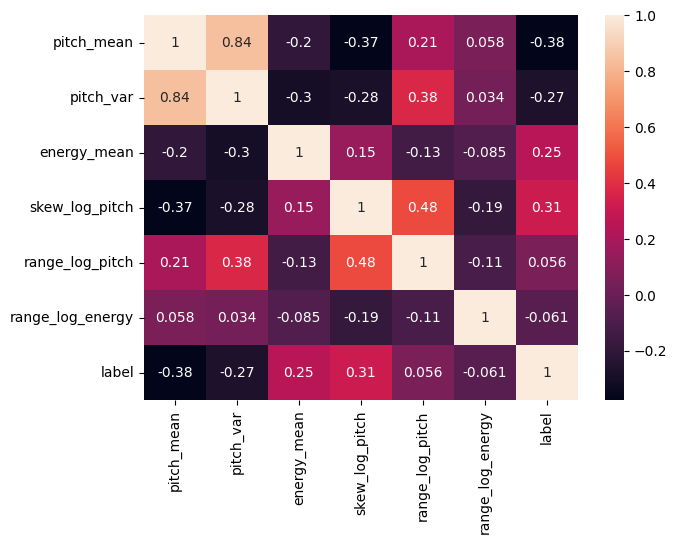

In [6]:
# look at the correlation of the data
plt.figure(figsize=(7,5))
sns.heatmap(df_train.corr(), annot=True)
plt.show()

We can see that *pitch_var* and *pitch_mean* show a highly positive correlation. *skew_log_pitch* and *range_log_pitch* are also positively correlated. 
Nevertheless, we also see that the features are not highly correlated with the target class which means they are not as useful for a model.

In [7]:
# compare statistics of these features per class
df_train.groupby('label').describe()

pitch_mean                                                              \
           count      mean       std       min       25%       50%       75%   
label                                                                          
0          101.0  0.677343  0.855226 -1.251472  0.089311  0.594308  1.225692   
1           65.0 -0.369539  0.635113 -1.487207 -1.010333 -0.189707  0.121623   
2           37.0 -0.167482  0.558853 -1.117641 -0.571088 -0.208583  0.282201   
3           55.0  0.092085  0.873342 -1.290931 -0.600653  0.018881  0.688631   
4           57.0  0.877660  1.008013 -1.009501 -0.001963  0.879762  1.722778   
5           63.0 -0.613986  0.630759 -1.744938 -1.159417 -0.630997 -0.062818   
6           50.0 -1.092098  0.474572 -1.706068 -1.429333 -1.267830 -0.743700   

                pitch_var                                                    \
            max     count      mean       std       min       25%       50%   
label                                                                         
0      2.692204     101.0  0.717107  0.979774 -0.697548 -0.076742  0.541360   
1      0.767083      65.0 -0.697183  0.398728 -1.291268 -1.102982 -0.612336   
2      0.881540      37.0 -0.080963  0.572717 -1.009538 -0.368849 -0.033832   
3      1.945334      55.0  0.003943  0.810934 -1.133973 -0.712991  0.029572   
4      2.835905      57.0  0.846014  1.097488 -0.874935  0.022357  0.584141   
5      0.397259      63.0 -0.718545  0.415315 -1.289338 -1.119424 -0.744759   
6      0.440132      50.0 -0.545734  0.705275 -1.220034 -0.973630 -0.671372   

                          energy_mean                                          \
            75%       max       count      mean       std       min       25%   
label                                                                           
0      1.225628  3.318273       101.0 -0.520240  0.822309 -2.107909 -1.218517   
1     -0.414241  0.198203        65.0  0.046929  0.862784 -1.846894 -0.525459   
2      0.298767  1.760594        37.0 -0.209340  1.035237 -1.740253 -0.966403   
3      0.539462  2.068990        55.0  0.547975  0.957716 -1.693062 -0.110773   
4      1.806167  3.676278        57.0 -0.247058  0.917782 -1.850335 -1.006338   
5     -0.357826  0.084162        63.0  0.644422  0.929934 -1.102191  0.044769   
6     -0.431842  2.586539        50.0  0.011689  0.995678 -1.833988 -0.726030   

                                    skew_log_pitch                      \
            50%       75%       max          count      mean       std   
label                                                                    
0     -0.592026 -0.003472  1.860423          101.0 -0.547832  0.502825   
1      0.026043  0.615469  1.925876           65.0  0.354454  0.746064   
2     -0.275437  0.460081  2.625471           37.0 -0.192836  0.860993   
3      0.537742  1.153073  2.905434           55.0  0.020290  0.950929   
4     -0.125921  0.374591  1.772841           57.0 -0.423766  0.404688   
5      0.483468  1.181898  2.871500           63.0  0.101081  1.008876   
6      0.023794  0.658125  2.675483           50.0  1.121942  1.468061   

                                                        range_log_pitch  \
            min       25%       50%       75%       max           count   
label                                                                     
0     -1.568373 -0.933986 -0.520488 -0.194099  0.901545           101.0   
1     -1.040232 -0.082342  0.196093  0.585814  3.084279            65.0   
2     -2.247746 -0.806970 -0.116485  0.370451  1.463380            37.0   
3     -1.417732 -0.515310 -0.185010  0.331650  3.293279            55.0   
4     -1.442542 -0.693391 -0.458158 -0.096612  0.298299            57.0   
5     -1.666897 -0.498109 -0.214325  0.255486  3.106937            63.0   
6     -1.105572  0.040249  0.734994  2.028398  5.079877            50.0   

                                                                             \
           mean       std       

In [8]:
svm_model = SVC(kernel='rbf', C=1, gamma=0.1, class_weight='balanced', decision_function_shape='ovo')
svm_model.fit(X_train, y_train)

SVC(C=1, class_weight='balanced', decision_function_shape='ovo', gamma=0.1)


Evaluation: f1_score
52.59% for the train data
49.64% for the test data

Evaluation: accuracy_score
53.74% for the train data
52.34% for the test data

Evaluation: precision_score
56.00% for the train data
50.92% for the test data

Evaluation: recall_score
53.04% for the train data
51.31% for the test data

Evaluation: confusion_matrix of test predictions


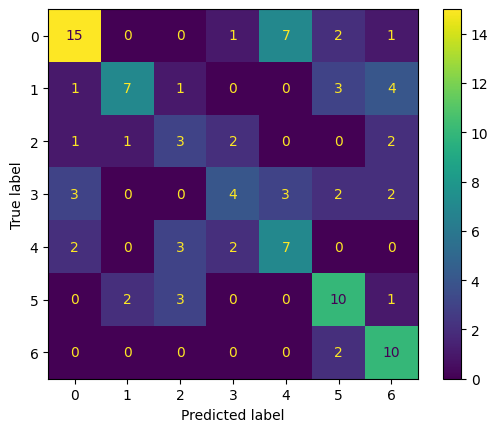


Hard cases for the model:

Label: anger(0)
Hard cases of false negatives: ['happiness(4)']

Label: boredom(1)
Hard cases of false negatives: ['sadness(6)']

Label: disgust(2)
Hard cases of false negatives: ['fear(3)', 'sadness(6)']
Hard cases of false positives: ['happiness(4)', 'neutral(5)']

Label: fear(3)
Hard cases of false negatives: ['anger(0)', 'happiness(4)']
Hard cases of false positives: ['disgust(2)', 'happiness(4)']

Label: happiness(4)
Hard cases of false negatives: ['disgust(2)']
Hard cases of false positives: ['anger(0)']



In [9]:
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

A snippet of the data:


,pitch_mean,energy_mean,range_log_pitch,range_log_energy
476,1.945334,-0.484114,-0.965981,0.073611
231,-0.788647,0.452990,0.365528,0.121827
409,-0.210904,0.374591,1.661811,0.124962
69,-0.059617,-0.498798,1.746532,-0.069685
68,0.362861,-0.611827,0.709389,0.068940


There are 428 entries with 4 columns in the training data.
There are 107 entries with 4 columns in the testing data.

Evaluation: f1_score
40.22% for the train data
32.14% for the test data

Evaluation: accuracy_score
42.06% for the train data
35.51% for the test data

Evaluation: precision_score
40.89% for the train data
31.92% for the test data

Evaluation: recall_score
41.06% for the train data
33.76% for the test data

Evaluation: confusion_matrix of test predictions


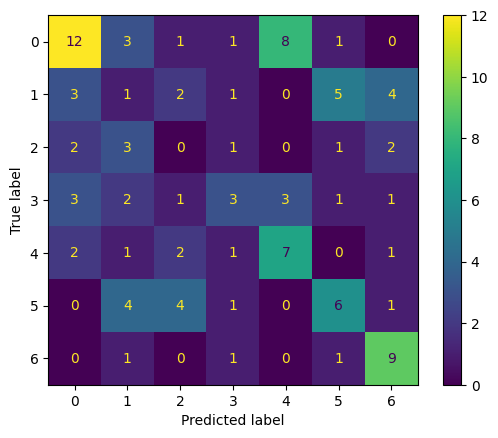


Hard cases for the model:

Label: anger(0)
Hard cases of false negatives: ['happiness(4)']

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)', 'sadness(6)']
Hard cases of false positives: ['neutral(5)']

Label: disgust(2)
Hard cases of false negatives: ['anger(0)', 'boredom(1)', 'sadness(6)']
Hard cases of false positives: ['neutral(5)']

Label: fear(3)
Hard cases of false negatives: ['anger(0)', 'happiness(4)']

Label: happiness(4)
Hard cases of false positives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)', 'disgust(2)']
Hard cases of false positives: ['boredom(1)']

Label: sadness(6)
Hard cases of false positives: ['boredom(1)']



In [10]:
# drop correlated features and run again
df6param_uncor = df6param.drop(columns=['pitch_var', 'skew_log_pitch'])
# Load the train/test data
X_train_uncor, X_test_uncor, y_train_uncor, y_test_uncor = load_train_test_data(df6param_uncor, test_size=0.2)
svm_model.fit(X_train_uncor, y_train_uncor)
model_eval(svm_model, X_train_uncor, X_test_uncor, y_train_uncor, y_test_uncor, confusion=True)

Actually performs worse when dropping these features. 
Next, we try to run this very simple approach with a 70-30 train-test ratio.

### 70-30 ratio

A snippet of the data:


,pitch_mean,pitch_var,energy_mean,skew_log_pitch,range_log_pitch,range_log_energy
383,1.182553,0.801083,0.317074,-0.618316,0.819217,0.128217
180,-1.263687,-1.047336,1.235771,5.249191,1.722070,-0.027147
447,-0.849733,-0.705906,0.816171,3.409838,1.820974,-18.587455
409,-0.208289,0.346673,0.392074,0.326424,1.693165,0.125971
268,0.602343,0.801093,0.514854,-1.108382,0.143329,0.128649


There are 374 entries with 6 columns in the training data.
There are 161 entries with 6 columns in the testing data.

Evaluation: f1_score
54.35% for the train data
46.29% for the test data

Evaluation: accuracy_score
55.61% for the train data
48.45% for the test data

Evaluation: precision_score
56.99% for the train data
48.25% for the test data

Evaluation: recall_score
54.73% for the train data
47.59% for the test data

Evaluation: confusion_matrix of test predictions


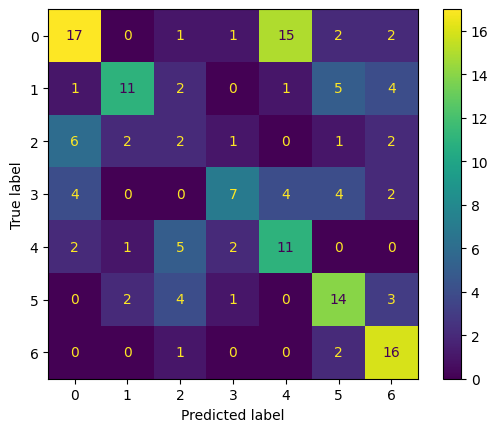


Hard cases for the model:

Label: anger(0)
Hard cases of false negatives: ['happiness(4)']

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']

Label: disgust(2)
Hard cases of false negatives: ['anger(0)']
Hard cases of false positives: ['happiness(4)', 'neutral(5)']

Label: happiness(4)
Hard cases of false negatives: ['disgust(2)']
Hard cases of false positives: ['anger(0)']



In [11]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df6param, test_size=0.3)
svm_model.fit(X_train, y_train)
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

# SVM 
##  Shen et al. (2011) "Automatic Speech Emotion Recognition Using Support Vector Machine" (Paper 3)

In [12]:
# load the data
df = pd.read_pickle('../results/df_prep_numerical_only.pkl')
df.columns

Index(['duration', 'mean', 'median', 'max', 'min', 'var', 'std',
       'speaking_rate', 'articulation_rate', 'asd',
       ...
       'lpc_local2_min', 'lpc_local3_mean', 'lpc_local3_var', 'lpc_local3_max',
       'lpc_local3_min', 'lpc_local4_mean', 'lpc_local4_var', 'lpc_local4_max',
       'lpc_local4_min', 'label'],
      dtype='object', length=270)

In [13]:
# selection of features: 
# energy features (19-dim), pitch features (19-dim), LPCCs (48-dim), MFCCs (52-dim), LPCMFCCs (48-dim) 
# -> 186 features + label
df_3 = df.filter(regex='energy_|pitch_|lpccs_|^mfccs|lpcmfccs_|label')
df_3.columns

Index(['energy_max', 'energy_mean', 'energy_var', 'energy_rising_duration_max',
       'energy_rising_duration_mean', 'energy_rising_duration_median',
       'energy_rising_duration_iqr', 'energy_falling_duration_max',
       'energy_falling_duration_mean', 'energy_falling_duration_median',
       ...
       'lpcmfccs_local9_min', 'lpcmfccs_local10_mean', 'lpcmfccs_local10_var',
       'lpcmfccs_local10_max', 'lpcmfccs_local10_min', 'lpcmfccs_local11_mean',
       'lpcmfccs_local11_var', 'lpcmfccs_local11_max', 'lpcmfccs_local11_min',
       'label'],
      dtype='object', length=187)

In [14]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_3, test_size=0.3)

A snippet of the data:


,energy_max,energy_mean,energy_var,energy_rising_duration_max,energy_rising_duration_mean,energy_rising_duration_median,energy_rising_duration_iqr,energy_falling_duration_max,energy_falling_duration_mean,energy_falling_duration_median,energy_falling_duration_iqr,energy_rising_value_max,energy_rising_value_mean,energy_rising_value_median,energy_rising_value_iqr,energy_falling_value_max,energy_falling_value_mean,energy_falling_value_median,energy_falling_value_iqr,pitch_max,pitch_mean,pitch_var,pitch_rising_duration_max,pitch_rising_duration_mean,pitch_rising_duration_median,pitch_rising_duration_iqr,pitch_falling_duration_max,pitch_falling_duration_mean,pitch_falling_duration_median,pitch_falling_duration_iqr,pitch_rising_value_max,pitch_rising_value_mean,pitch_rising_value_median,pitch_rising_value_iqr,pitch_falling_value_max,pitch_falling_value_mean,pitch_falling_value_median,pitch_falling_value_iqr,mfccs0_mean,mfccs0_var,mfccs0_max,mfccs0_min,mfccs1_mean,mfccs1_var,mfccs1_max,mfccs1_min,mfccs2_mean,mfccs2_var,mfccs2_max,mfccs2_min,mfccs3_mean,mfccs3_var,mfccs3_max,mfccs3_min,mfccs4_mean,mfccs4_var,mfccs4_max,mfccs4_min,mfccs5_mean,mfccs5_var,mfccs5_max,mfccs5_min,mfccs6_mean,mfccs6_var,mfccs6_max,mfccs6_min,mfccs7_mean,mfccs7_var,mfccs7_max,mfccs7_min,mfccs8_mean,mfccs8_var,mfccs8_max,mfccs8_min,mfccs9_mean,mfccs9_var,mfccs9_max,mfccs9_min,mfccs10_mean,mfccs10_var,mfccs10_max,mfccs10_min,mfccs11_mean,mfccs11_var,mfccs11_max,mfccs11_min,mfccs12_mean,mfccs12_var,mfccs12_max,mfccs12_min,lpccs_local0_mean,lpccs_local0_var,lpccs_local0_max,lpccs_local0_min,lpccs_local1_mean,lpccs_local1_var,lpccs_local1_max,lpccs_local1_min,lpccs_local2_mean,lpccs_local2_var,lpccs_local2_max,lpccs_local2_min,lpccs_local3_mean,lpccs_local3_var,lpccs_local3_max,lpccs_local3_min,lpccs_local4_mean,lpccs_local4_var,lpccs_local4_max,lpccs_local4_min,lpccs_local5_mean,lpccs_local5_var,lpccs_local5_max,lpccs_local5_min,lpccs_local6_mean,lpccs_local6_var,lpccs_local6_max,lpccs_local6_min,lpccs_local7_mean,lpccs_local7_var,lpccs_local7_max,lpccs_local7_min,lpccs_local8_mean,lpccs_local8_var,lpccs_local8_max,lpccs_local8_min,lpccs_local9_mean,lpccs_local9_var,lpccs_local9_max,lpccs_local9_min,lpccs_local10_mean,lpccs_local10_var,lpccs_local10_max,lpccs_local10_min,lpccs_local11_mean,lpccs_local11_var,lpccs_local11_max,lpccs_local11_min,lpcmfccs_local0_mean,lpcmfccs_local0_var,lpcmfccs_local0_max,lpcmfccs_local0_min,lpcmfccs_local1_mean,lpcmfccs_local1_var,lpcmfccs_local1_max,lpcmfccs_local1_min,lpcmfccs_local2_mean,lpcmfccs_local2_var,lpcmfccs_local2_max,lpcmfccs_local2_min,lpcmfccs_local3_mean,lpcmfccs_local3_var,lpcmfccs_local3_max,lpcmfccs_local3_min,lpcmfccs_local4_mean,lpcmfccs_local4_var,lpcmfccs_local4_max,lpcmfccs_local4_min,lpcmfccs_local5_mean,lpcmfccs_local5_var,lpcmfccs_local5_max,lpcmfccs_local5_min,lpcmfccs_local6_mean,lpcmfccs_local6_var,lpcmfccs_local6_max,lpcmfccs_local6_min,lpcmfccs_local7_mean,lpcmfccs_local7_var,lpcmfccs_local7_max,lpcmfccs_local7_min,lpcmfccs_local8_mean,lpcmfccs_local8_var,lpcmfccs_local8_max,lpcmfccs_local8_min,lpcmfccs_local9_mean,lpcmfccs_local9_var,lpcmfccs_local9_max,lpcmfccs_local9_min,lpcmfccs_local10_mean,lpcmfccs_local10_var,lpcmfccs_local10_max,lpcmfccs_local10_min,lpcmfccs_local11_mean,lpcmfccs_local11_var,lpcmfccs_local11_max,lpcmfccs_local11_min
383,0.173441,0.317074,-0.496315,0.144882,-0.102037,-0.425719,-0.278322,0.454021,-0.598256,-0.681587,-0.565616,0.873894,0.269033,0.050956,0.052259,-0.256754,-0.267588,0.226114,-0.122111,0.753365,1.182553,0.801083,-0.433432,0.369099,0.438826,0.762153,-0.178719,0.148716,-0.323972,-0.267896,-0.829156,0.588680,2.250965,1.182838,-0.033126,-0.700466,-1.415411,1.424176,0.435260,0.843788,1.147327,-1.074916,-0.997914,1.187195,0.031466,-2.143088,-0.237505,0.242583,-0.595157,-0.773083,-0.328507,-0.063465,-0.403762,-0.495334,-0.964237,1.288843,-0.517557,-1.319633,-0.916971,0.384764,0.102743,-0.507791,-0.436511,-0.354251,-0.815074,-0.295162,0.485352,-1.319689,-1.267152,0.821676,

There are 374 entries with 186 columns in the training data.
There are 161 entries with 186 columns in the testing data.


In [15]:
svm_model = SVC(kernel='rbf', C=1, gamma=0.1, class_weight='balanced', decision_function_shape='ovo')
svm_model.fit(X_train, y_train)

SVC(C=1, class_weight='balanced', decision_function_shape='ovo', gamma=0.1)


Evaluation: f1_score
100.00% for the train data
3.71% for the test data

Evaluation: accuracy_score
100.00% for the train data
14.91% for the test data

Evaluation: precision_score
100.00% for the train data
2.13% for the test data

Evaluation: recall_score
100.00% for the train data
14.29% for the test data

Evaluation: confusion_matrix of test predictions


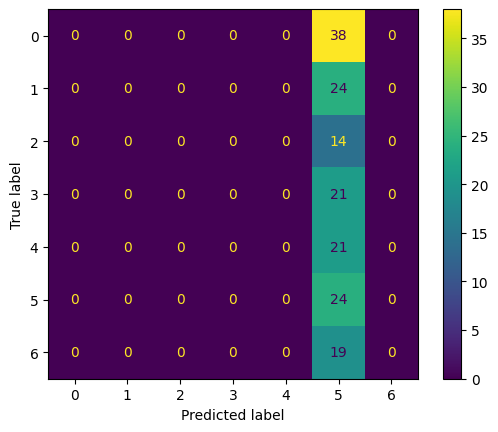


Hard cases for the model:

Label: anger(0)
Hard cases of false negatives: ['neutral(5)']

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']

Label: disgust(2)
Hard cases of false negatives: ['neutral(5)']

Label: fear(3)
Hard cases of false negatives: ['neutral(5)']

Label: happiness(4)
Hard cases of false negatives: ['neutral(5)']

Label: neutral(5)
Hard cases of false positives: ['anger(0)']

Label: sadness(6)
Hard cases of false negatives: ['neutral(5)']



In [16]:
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

In [17]:
svm_model = SVC(kernel='rbf')
svm_model.fit(X_train, y_train)

SVC()


Evaluation: f1_score
93.41% for the train data
75.44% for the test data

Evaluation: accuracy_score
93.32% for the train data
76.40% for the test data

Evaluation: precision_score
94.58% for the train data
78.46% for the test data

Evaluation: recall_score
92.69% for the train data
74.27% for the test data

Evaluation: confusion_matrix of test predictions


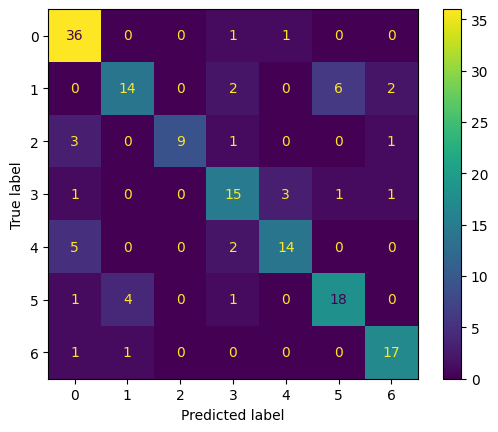


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']
Hard cases of false positives: ['neutral(5)']

Label: disgust(2)
Hard cases of false negatives: ['anger(0)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']

Label: neutral(5)
Hard cases of false positives: ['boredom(1)']



In [18]:
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

This is actually a really good result! We achieve 93.41% F1 macro on train set and 75.44% on the test set.

### Try with 90-10 train-test split as in paper

In [19]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_3, test_size=0.1)

A snippet of the data:


,energy_max,energy_mean,energy_var,energy_rising_duration_max,energy_rising_duration_mean,energy_rising_duration_median,energy_rising_duration_iqr,energy_falling_duration_max,energy_falling_duration_mean,energy_falling_duration_median,energy_falling_duration_iqr,energy_rising_value_max,energy_rising_value_mean,energy_rising_value_median,energy_rising_value_iqr,energy_falling_value_max,energy_falling_value_mean,energy_falling_value_median,energy_falling_value_iqr,pitch_max,pitch_mean,pitch_var,pitch_rising_duration_max,pitch_rising_duration_mean,pitch_rising_duration_median,pitch_rising_duration_iqr,pitch_falling_duration_max,pitch_falling_duration_mean,pitch_falling_duration_median,pitch_falling_duration_iqr,pitch_rising_value_max,pitch_rising_value_mean,pitch_rising_value_median,pitch_rising_value_iqr,pitch_falling_value_max,pitch_falling_value_mean,pitch_falling_value_median,pitch_falling_value_iqr,mfccs0_mean,mfccs0_var,mfccs0_max,mfccs0_min,mfccs1_mean,mfccs1_var,mfccs1_max,mfccs1_min,mfccs2_mean,mfccs2_var,mfccs2_max,mfccs2_min,mfccs3_mean,mfccs3_var,mfccs3_max,mfccs3_min,mfccs4_mean,mfccs4_var,mfccs4_max,mfccs4_min,mfccs5_mean,mfccs5_var,mfccs5_max,mfccs5_min,mfccs6_mean,mfccs6_var,mfccs6_max,mfccs6_min,mfccs7_mean,mfccs7_var,mfccs7_max,mfccs7_min,mfccs8_mean,mfccs8_var,mfccs8_max,mfccs8_min,mfccs9_mean,mfccs9_var,mfccs9_max,mfccs9_min,mfccs10_mean,mfccs10_var,mfccs10_max,mfccs10_min,mfccs11_mean,mfccs11_var,mfccs11_max,mfccs11_min,mfccs12_mean,mfccs12_var,mfccs12_max,mfccs12_min,lpccs_local0_mean,lpccs_local0_var,lpccs_local0_max,lpccs_local0_min,lpccs_local1_mean,lpccs_local1_var,lpccs_local1_max,lpccs_local1_min,lpccs_local2_mean,lpccs_local2_var,lpccs_local2_max,lpccs_local2_min,lpccs_local3_mean,lpccs_local3_var,lpccs_local3_max,lpccs_local3_min,lpccs_local4_mean,lpccs_local4_var,lpccs_local4_max,lpccs_local4_min,lpccs_local5_mean,lpccs_local5_var,lpccs_local5_max,lpccs_local5_min,lpccs_local6_mean,lpccs_local6_var,lpccs_local6_max,lpccs_local6_min,lpccs_local7_mean,lpccs_local7_var,lpccs_local7_max,lpccs_local7_min,lpccs_local8_mean,lpccs_local8_var,lpccs_local8_max,lpccs_local8_min,lpccs_local9_mean,lpccs_local9_var,lpccs_local9_max,lpccs_local9_min,lpccs_local10_mean,lpccs_local10_var,lpccs_local10_max,lpccs_local10_min,lpccs_local11_mean,lpccs_local11_var,lpccs_local11_max,lpccs_local11_min,lpcmfccs_local0_mean,lpcmfccs_local0_var,lpcmfccs_local0_max,lpcmfccs_local0_min,lpcmfccs_local1_mean,lpcmfccs_local1_var,lpcmfccs_local1_max,lpcmfccs_local1_min,lpcmfccs_local2_mean,lpcmfccs_local2_var,lpcmfccs_local2_max,lpcmfccs_local2_min,lpcmfccs_local3_mean,lpcmfccs_local3_var,lpcmfccs_local3_max,lpcmfccs_local3_min,lpcmfccs_local4_mean,lpcmfccs_local4_var,lpcmfccs_local4_max,lpcmfccs_local4_min,lpcmfccs_local5_mean,lpcmfccs_local5_var,lpcmfccs_local5_max,lpcmfccs_local5_min,lpcmfccs_local6_mean,lpcmfccs_local6_var,lpcmfccs_local6_max,lpcmfccs_local6_min,lpcmfccs_local7_mean,lpcmfccs_local7_var,lpcmfccs_local7_max,lpcmfccs_local7_min,lpcmfccs_local8_mean,lpcmfccs_local8_var,lpcmfccs_local8_max,lpcmfccs_local8_min,lpcmfccs_local9_mean,lpcmfccs_local9_var,lpcmfccs_local9_max,lpcmfccs_local9_min,lpcmfccs_local10_mean,lpcmfccs_local10_var,lpcmfccs_local10_max,lpcmfccs_local10_min,lpcmfccs_local11_mean,lpcmfccs_local11_var,lpcmfccs_local11_max,lpcmfccs_local11_min
237,0.134084,0.163449,0.233662,0.600079,-0.616370,-1.626439,0.257282,0.822829,0.498099,-0.011603,0.921021,0.877566,-0.593869,-0.396633,-0.278548,0.525364,0.595542,-0.267342,-0.872663,-1.370578,-1.151051,-1.073874,0.606526,0.875777,0.799660,-0.246829,0.257617,1.617429,1.189620,1.913811,-1.169462,-0.135390,0.081862,-0.603517,-0.052978,0.062310,-0.857282,-0.360638,-0.042366,1.155356,0.094030,0.266648,0.371805,-0.257347,0.183010,-0.047262,0.937951,-0.844600,1.268367,1.056349,0.669529,-0.287957,0.877675,-0.448005,0.429185,-0.803712,-0.142850,0.681509,1.031039,-1.156765,-0.286828,1.000055,0.899117,-1.121507,-0.349815,1.264959,0.896537,0.052638,0.038731,0.289295,0.855852,

There are 481 entries with 186 columns in the training data.
There are 54 entries with 186 columns in the testing data.


In [20]:
svm_model = SVC(kernel='rbf')
svm_model.fit(X_train, y_train)

SVC()


Evaluation: f1_score
93.72% for the train data
75.45% for the test data

Evaluation: accuracy_score
93.76% for the train data
75.93% for the test data

Evaluation: precision_score
94.80% for the train data
78.75% for the test data

Evaluation: recall_score
93.00% for the train data
74.28% for the test data

Evaluation: confusion_matrix of test predictions


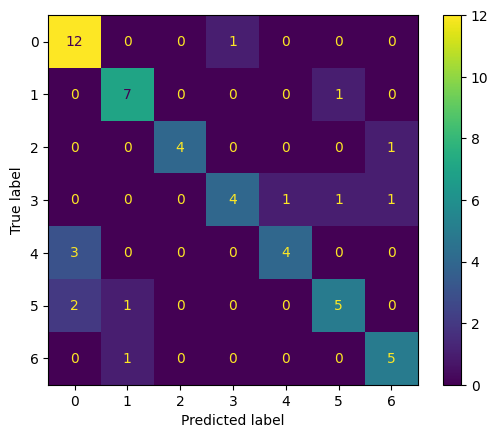


Hard cases for the model:

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['anger(0)']



In [21]:
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

The models are almost equally good. Just the hard cases change slightly.

### Try with 5 emotions only as in paper (disgust, boredom, sadness, neutral, and happiness)

In [22]:
df_5emos = df_3[df_3['label'].isin(['disgust', 'boredom', 'sadness', 'neutral', 'happiness'])].reset_index(drop=True)
df_5emos.shape

# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_5emos, test_size=0.3)

A snippet of the data:


,energy_max,energy_mean,energy_var,energy_rising_duration_max,energy_rising_duration_mean,energy_rising_duration_median,energy_rising_duration_iqr,energy_falling_duration_max,energy_falling_duration_mean,energy_falling_duration_median,energy_falling_duration_iqr,energy_rising_value_max,energy_rising_value_mean,energy_rising_value_median,energy_rising_value_iqr,energy_falling_value_max,energy_falling_value_mean,energy_falling_value_median,energy_falling_value_iqr,pitch_max,pitch_mean,pitch_var,pitch_rising_duration_max,pitch_rising_duration_mean,pitch_rising_duration_median,pitch_rising_duration_iqr,pitch_falling_duration_max,pitch_falling_duration_mean,pitch_falling_duration_median,pitch_falling_duration_iqr,pitch_rising_value_max,pitch_rising_value_mean,pitch_rising_value_median,pitch_rising_value_iqr,pitch_falling_value_max,pitch_falling_value_mean,pitch_falling_value_median,pitch_falling_value_iqr,mfccs0_mean,mfccs0_var,mfccs0_max,mfccs0_min,mfccs1_mean,mfccs1_var,mfccs1_max,mfccs1_min,mfccs2_mean,mfccs2_var,mfccs2_max,mfccs2_min,mfccs3_mean,mfccs3_var,mfccs3_max,mfccs3_min,mfccs4_mean,mfccs4_var,mfccs4_max,mfccs4_min,mfccs5_mean,mfccs5_var,mfccs5_max,mfccs5_min,mfccs6_mean,mfccs6_var,mfccs6_max,mfccs6_min,mfccs7_mean,mfccs7_var,mfccs7_max,mfccs7_min,mfccs8_mean,mfccs8_var,mfccs8_max,mfccs8_min,mfccs9_mean,mfccs9_var,mfccs9_max,mfccs9_min,mfccs10_mean,mfccs10_var,mfccs10_max,mfccs10_min,mfccs11_mean,mfccs11_var,mfccs11_max,mfccs11_min,mfccs12_mean,mfccs12_var,mfccs12_max,mfccs12_min,lpccs_local0_mean,lpccs_local0_var,lpccs_local0_max,lpccs_local0_min,lpccs_local1_mean,lpccs_local1_var,lpccs_local1_max,lpccs_local1_min,lpccs_local2_mean,lpccs_local2_var,lpccs_local2_max,lpccs_local2_min,lpccs_local3_mean,lpccs_local3_var,lpccs_local3_max,lpccs_local3_min,lpccs_local4_mean,lpccs_local4_var,lpccs_local4_max,lpccs_local4_min,lpccs_local5_mean,lpccs_local5_var,lpccs_local5_max,lpccs_local5_min,lpccs_local6_mean,lpccs_local6_var,lpccs_local6_max,lpccs_local6_min,lpccs_local7_mean,lpccs_local7_var,lpccs_local7_max,lpccs_local7_min,lpccs_local8_mean,lpccs_local8_var,lpccs_local8_max,lpccs_local8_min,lpccs_local9_mean,lpccs_local9_var,lpccs_local9_max,lpccs_local9_min,lpccs_local10_mean,lpccs_local10_var,lpccs_local10_max,lpccs_local10_min,lpccs_local11_mean,lpccs_local11_var,lpccs_local11_max,lpccs_local11_min,lpcmfccs_local0_mean,lpcmfccs_local0_var,lpcmfccs_local0_max,lpcmfccs_local0_min,lpcmfccs_local1_mean,lpcmfccs_local1_var,lpcmfccs_local1_max,lpcmfccs_local1_min,lpcmfccs_local2_mean,lpcmfccs_local2_var,lpcmfccs_local2_max,lpcmfccs_local2_min,lpcmfccs_local3_mean,lpcmfccs_local3_var,lpcmfccs_local3_max,lpcmfccs_local3_min,lpcmfccs_local4_mean,lpcmfccs_local4_var,lpcmfccs_local4_max,lpcmfccs_local4_min,lpcmfccs_local5_mean,lpcmfccs_local5_var,lpcmfccs_local5_max,lpcmfccs_local5_min,lpcmfccs_local6_mean,lpcmfccs_local6_var,lpcmfccs_local6_max,lpcmfccs_local6_min,lpcmfccs_local7_mean,lpcmfccs_local7_var,lpcmfccs_local7_max,lpcmfccs_local7_min,lpcmfccs_local8_mean,lpcmfccs_local8_var,lpcmfccs_local8_max,lpcmfccs_local8_min,lpcmfccs_local9_mean,lpcmfccs_local9_var,lpcmfccs_local9_max,lpcmfccs_local9_min,lpcmfccs_local10_mean,lpcmfccs_local10_var,lpcmfccs_local10_max,lpcmfccs_local10_min,lpcmfccs_local11_mean,lpcmfccs_local11_var,lpcmfccs_local11_max,lpcmfccs_local11_min
284,0.149697,0.038640,-0.155306,-0.886677,0.362794,0.904762,-0.679326,-0.618067,-0.325788,-0.039004,0.369695,0.736519,0.400003,0.411947,0.301027,0.509546,-0.396079,-0.600084,2.045331,-1.494247,-1.287531,-1.066642,-0.399076,0.330378,0.193776,1.374007,-0.082787,-0.791131,-1.214911,-1.308438,-1.225682,-1.061486,-0.721143,-0.714191,0.318618,0.932409,0.335137,-0.643499,0.024858,0.712715,-0.224830,-0.160131,0.771921,-0.264350,0.176053,-0.247435,-0.225297,0.477715,0.860273,-0.077779,2.667855,0.865235,2.429054,1.023554,1.000573,-0.319375,0.228305,0.785824,0.739975,-0.635480,0.774183,0.706622,1.015549,-1.253847,-0.008723,1.246422,0.413995,1.652761,0.969751,-0.888689,0.37137

There are 237 entries with 186 columns in the training data.
There are 102 entries with 186 columns in the testing data.


In [23]:
svm_model = SVC(kernel='rbf')
svm_model.fit(X_train, y_train)

SVC()


Evaluation: f1_score
97.40% for the train data
77.14% for the test data

Evaluation: accuracy_score
97.05% for the train data
75.49% for the test data

Evaluation: precision_score
97.41% for the train data
78.85% for the test data

Evaluation: recall_score
97.39% for the train data
76.01% for the test data

Evaluation: confusion_matrix of test predictions


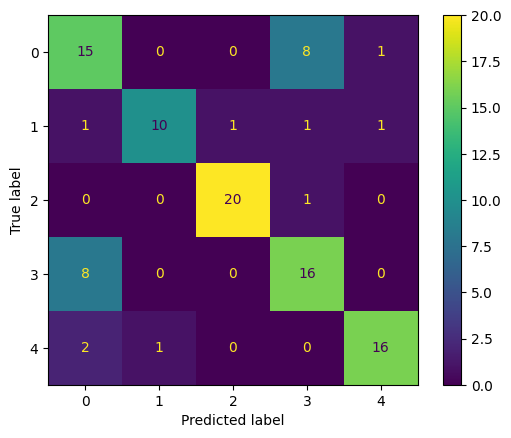


Hard cases for the model:

Label: boredom(0)
Hard cases of false negatives: ['neutral(3)']
Hard cases of false positives: ['neutral(3)']

Label: neutral(3)
Hard cases of false negatives: ['boredom(0)']
Hard cases of false positives: ['boredom(0)']



In [24]:
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True, emotions='5emos')

Do the same with the 90-10 train-test split.

In [25]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_5emos, test_size=0.1)

A snippet of the data:


,energy_max,energy_mean,energy_var,energy_rising_duration_max,energy_rising_duration_mean,energy_rising_duration_median,energy_rising_duration_iqr,energy_falling_duration_max,energy_falling_duration_mean,energy_falling_duration_median,energy_falling_duration_iqr,energy_rising_value_max,energy_rising_value_mean,energy_rising_value_median,energy_rising_value_iqr,energy_falling_value_max,energy_falling_value_mean,energy_falling_value_median,energy_falling_value_iqr,pitch_max,pitch_mean,pitch_var,pitch_rising_duration_max,pitch_rising_duration_mean,pitch_rising_duration_median,pitch_rising_duration_iqr,pitch_falling_duration_max,pitch_falling_duration_mean,pitch_falling_duration_median,pitch_falling_duration_iqr,pitch_rising_value_max,pitch_rising_value_mean,pitch_rising_value_median,pitch_rising_value_iqr,pitch_falling_value_max,pitch_falling_value_mean,pitch_falling_value_median,pitch_falling_value_iqr,mfccs0_mean,mfccs0_var,mfccs0_max,mfccs0_min,mfccs1_mean,mfccs1_var,mfccs1_max,mfccs1_min,mfccs2_mean,mfccs2_var,mfccs2_max,mfccs2_min,mfccs3_mean,mfccs3_var,mfccs3_max,mfccs3_min,mfccs4_mean,mfccs4_var,mfccs4_max,mfccs4_min,mfccs5_mean,mfccs5_var,mfccs5_max,mfccs5_min,mfccs6_mean,mfccs6_var,mfccs6_max,mfccs6_min,mfccs7_mean,mfccs7_var,mfccs7_max,mfccs7_min,mfccs8_mean,mfccs8_var,mfccs8_max,mfccs8_min,mfccs9_mean,mfccs9_var,mfccs9_max,mfccs9_min,mfccs10_mean,mfccs10_var,mfccs10_max,mfccs10_min,mfccs11_mean,mfccs11_var,mfccs11_max,mfccs11_min,mfccs12_mean,mfccs12_var,mfccs12_max,mfccs12_min,lpccs_local0_mean,lpccs_local0_var,lpccs_local0_max,lpccs_local0_min,lpccs_local1_mean,lpccs_local1_var,lpccs_local1_max,lpccs_local1_min,lpccs_local2_mean,lpccs_local2_var,lpccs_local2_max,lpccs_local2_min,lpccs_local3_mean,lpccs_local3_var,lpccs_local3_max,lpccs_local3_min,lpccs_local4_mean,lpccs_local4_var,lpccs_local4_max,lpccs_local4_min,lpccs_local5_mean,lpccs_local5_var,lpccs_local5_max,lpccs_local5_min,lpccs_local6_mean,lpccs_local6_var,lpccs_local6_max,lpccs_local6_min,lpccs_local7_mean,lpccs_local7_var,lpccs_local7_max,lpccs_local7_min,lpccs_local8_mean,lpccs_local8_var,lpccs_local8_max,lpccs_local8_min,lpccs_local9_mean,lpccs_local9_var,lpccs_local9_max,lpccs_local9_min,lpccs_local10_mean,lpccs_local10_var,lpccs_local10_max,lpccs_local10_min,lpccs_local11_mean,lpccs_local11_var,lpccs_local11_max,lpccs_local11_min,lpcmfccs_local0_mean,lpcmfccs_local0_var,lpcmfccs_local0_max,lpcmfccs_local0_min,lpcmfccs_local1_mean,lpcmfccs_local1_var,lpcmfccs_local1_max,lpcmfccs_local1_min,lpcmfccs_local2_mean,lpcmfccs_local2_var,lpcmfccs_local2_max,lpcmfccs_local2_min,lpcmfccs_local3_mean,lpcmfccs_local3_var,lpcmfccs_local3_max,lpcmfccs_local3_min,lpcmfccs_local4_mean,lpcmfccs_local4_var,lpcmfccs_local4_max,lpcmfccs_local4_min,lpcmfccs_local5_mean,lpcmfccs_local5_var,lpcmfccs_local5_max,lpcmfccs_local5_min,lpcmfccs_local6_mean,lpcmfccs_local6_var,lpcmfccs_local6_max,lpcmfccs_local6_min,lpcmfccs_local7_mean,lpcmfccs_local7_var,lpcmfccs_local7_max,lpcmfccs_local7_min,lpcmfccs_local8_mean,lpcmfccs_local8_var,lpcmfccs_local8_max,lpcmfccs_local8_min,lpcmfccs_local9_mean,lpcmfccs_local9_var,lpcmfccs_local9_max,lpcmfccs_local9_min,lpcmfccs_local10_mean,lpcmfccs_local10_var,lpcmfccs_local10_max,lpcmfccs_local10_min,lpcmfccs_local11_mean,lpcmfccs_local11_var,lpcmfccs_local11_max,lpcmfccs_local11_min
102,2.398920,0.830190,0.693567,1.007519,1.187034,-0.351054,-1.457323,0.045118,1.622253,0.511836,2.169214,-2.876887,1.808834,2.859708,-1.203558,-1.832559,-1.805620,-1.233986,0.661553,-1.270980,-0.833356,-0.948737,-0.737318,-0.525697,-0.256136,0.662101,-0.556089,0.579761,0.121732,2.485130,-0.992360,-0.170972,-0.534695,-0.520207,0.280027,0.246305,-0.151772,0.127695,0.803036,-0.213872,-0.009050,-0.170153,1.612695,-0.409421,1.356898,2.766721,0.134454,-1.047388,-1.617935,0.857099,1.121627,-0.260692,1.297497,2.300354,0.298971,1.366911,1.435988,-0.183702,-0.538042,0.036835,-1.548316,-0.167303,-0.062100,-0.623762,-0.859717,-0.180510,-1.741858,-0.065849,-1.663810,-0.670186,0

There are 305 entries with 186 columns in the training data.
There are 34 entries with 186 columns in the testing data.


In [26]:
svm_model = SVC(kernel='rbf')
svm_model.fit(X_train, y_train)

SVC()


Evaluation: f1_score
96.69% for the train data
89.33% for the test data

Evaluation: accuracy_score
96.39% for the train data
88.24% for the test data

Evaluation: precision_score
96.93% for the train data
91.14% for the test data

Evaluation: recall_score
96.51% for the train data
88.50% for the test data

Evaluation: confusion_matrix of test predictions


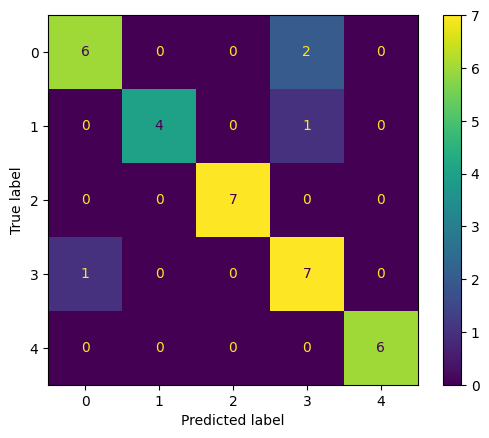


Hard cases for the model:

Label: boredom(0)
Hard cases of false negatives: ['neutral(3)']



In [27]:
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True, emotions='5emos')

Finally, we see that the model is even better with 5 emotions only. In this case, a 90-10 train-test split even improves the performance. Only with *boredom* and *neutral* it has a hard time.

### Test the model performance with a selection of features as in paper 3
### 1) Only energy and pitch

A snippet of the data:


,energy_max,energy_mean,energy_var,energy_rising_duration_max,energy_rising_duration_mean,energy_rising_duration_median,energy_rising_duration_iqr,energy_falling_duration_max,energy_falling_duration_mean,energy_falling_duration_median,energy_falling_duration_iqr,energy_rising_value_max,energy_rising_value_mean,energy_rising_value_median,energy_rising_value_iqr,energy_falling_value_max,energy_falling_value_mean,energy_falling_value_median,energy_falling_value_iqr,pitch_max,pitch_mean,pitch_var,pitch_rising_duration_max,pitch_rising_duration_mean,pitch_rising_duration_median,pitch_rising_duration_iqr,pitch_falling_duration_max,pitch_falling_duration_mean,pitch_falling_duration_median,pitch_falling_duration_iqr,pitch_rising_value_max,pitch_rising_value_mean,pitch_rising_value_median,pitch_rising_value_iqr,pitch_falling_value_max,pitch_falling_value_mean,pitch_falling_value_median,pitch_falling_value_iqr
237,0.134084,0.163449,0.233662,0.600079,-0.616370,-1.626439,0.257282,0.822829,0.498099,-0.011603,0.921021,0.877566,-0.593869,-0.396633,-0.278548,0.525364,0.595542,-0.267342,-0.872663,-1.370578,-1.151051,-1.073874,0.606526,0.875777,0.799660,-0.246829,0.257617,1.617429,1.189620,1.913811,-1.169462,-0.135390,0.081862,-0.603517,-0.052978,0.062310,-0.857282,-0.360638
459,-0.977889,0.292344,-0.522149,-0.792066,-0.616370,-0.409772,-0.551559,-0.233525,-1.138405,-1.871952,-0.797980,0.069901,-0.341255,-0.374150,-0.216001,-0.067647,0.339413,0.007196,-1.464602,1.532301,0.650723,-0.263820,-0.846150,-1.805057,-0.894774,-1.375239,-0.477533,-0.202763,0.175967,0.168912,0.152620,-0.228786,-0.717799,0.787761,0.289912,0.510538,0.092189,-0.126197
142,-0.977889,1.179218,0.912118,-0.328018,-0.327916,0.806896,-0.281945,-0.585643,-0.425057,-0.011603,0.429878,0.862831,-0.305939,-0.539685,0.214194,0.523557,0.307078,0.534937,0.149889,0.701471,-0.733316,-0.705076,-0.348090,-0.982180,-0.894774,-1.052837,1.074449,-0.740547,-0.837686,-0.703537,0.316903,-1.060327,-0.389332,-0.586747,0.258666,1.034274,0.575838,-0.786397
148,0.134084,0.096846,-1.012153,1.064128,0.823477,-0.409772,-0.281945,1.879182,2.152586,0.608513,1.903308,0.876091,0.344232,0.374186,-0.107945,-0.292239,-0.343007,0.436122,0.240286,-1.230253,-0.079663,-0.834652,-0.721635,-1.168447,-0.555887,-1.214038,-0.559216,-0.555818,-0.330860,0.823250,-0.858399,-0.867922,-0.636923,-0.848077,0.277181,0.947944,0.435822,-0.686081
124,-0.977889,-1.502746,-1.492387,-0.792066,-0.049157,0.806896,-1.360401,0.118593,-0.634865,-0.631719,-0.797980,0.200664,-1.116603,-0.763638,-1.288719,0.509582,1.117952,0.822935,-1.109621,0.726176,1.367181,2.067611,-0.348090,0.045827,0.460773,0.881581,0.992766,0.190640,-0.330860,-1.139762,0.114311,-0.397161,-0.212272,2.052706,0.163984,0.086387,0.332816,-0.172259


There are 481 entries with 38 columns in the training data.
There are 54 entries with 38 columns in the testing data.

Evaluation: f1_score
81.75% for the train data
52.79% for the test data

Evaluation: accuracy_score
82.74% for the train data
57.41% for the test data

Evaluation: precision_score
84.14% for the train data
61.68% for the test data

Evaluation: recall_score
80.54% for the train data
52.40% for the test data

Evaluation: confusion_matrix of test predictions


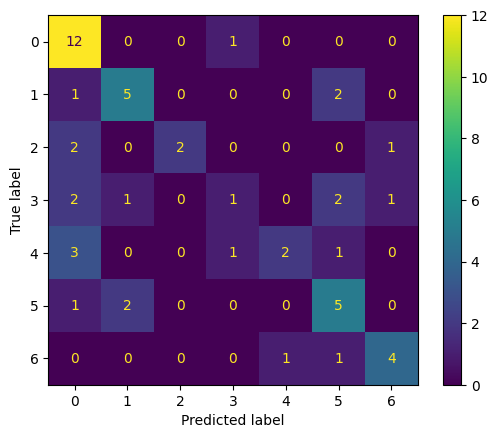


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']
Hard cases of false positives: ['neutral(5)']

Label: disgust(2)
Hard cases of false negatives: ['anger(0)']

Label: fear(3)
Hard cases of false negatives: ['anger(0)', 'neutral(5)']
Hard cases of false positives: ['anger(0)', 'happiness(4)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']
Hard cases of false positives: ['sadness(6)']

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)']



In [28]:
# select the features
df_3_ep = df_3.filter(regex='energy_|pitch_|label')

# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_3_ep, test_size=0.1)

# train the model
svm_model = SVC(kernel='rbf')
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

#### With 5 emos only

A snippet of the data:


,energy_max,energy_mean,energy_var,energy_rising_duration_max,energy_rising_duration_mean,energy_rising_duration_median,energy_rising_duration_iqr,energy_falling_duration_max,energy_falling_duration_mean,energy_falling_duration_median,energy_falling_duration_iqr,energy_rising_value_max,energy_rising_value_mean,energy_rising_value_median,energy_rising_value_iqr,energy_falling_value_max,energy_falling_value_mean,energy_falling_value_median,energy_falling_value_iqr,pitch_max,pitch_mean,pitch_var,pitch_rising_duration_max,pitch_rising_duration_mean,pitch_rising_duration_median,pitch_rising_duration_iqr,pitch_falling_duration_max,pitch_falling_duration_mean,pitch_falling_duration_median,pitch_falling_duration_iqr,pitch_rising_value_max,pitch_rising_value_mean,pitch_rising_value_median,pitch_rising_value_iqr,pitch_falling_value_max,pitch_falling_value_mean,pitch_falling_value_median,pitch_falling_value_iqr
102,2.398920,0.830190,0.693567,1.007519,1.187034,-0.351054,-1.457323,0.045118,1.622253,0.511836,2.169214,-2.876887,1.808834,2.859708,-1.203558,-1.832559,-1.805620,-1.233986,0.661553,-1.270980,-0.833356,-0.948737,-0.737318,-0.525697,-0.256136,0.662101,-0.556089,0.579761,0.121732,2.485130,-0.992360,-0.170972,-0.534695,-0.520207,0.280027,0.246305,-0.151772,0.127695
53,-0.962507,0.631972,-0.334816,0.540508,-0.678285,-1.534162,0.678333,0.380753,-1.065030,-1.936947,-0.607744,0.464399,-0.491407,-0.822484,-0.457045,0.385354,0.495005,0.704484,-0.006036,-0.400698,0.237193,-0.130498,0.402812,0.083770,0.173103,0.081811,-0.556089,-0.029473,0.121732,1.145540,0.137517,0.484233,-0.218420,-0.221894,0.300291,-0.194633,0.386323,0.208321
303,2.398920,1.559777,0.531814,-0.860525,0.362757,0.240501,0.144419,1.052022,1.953295,1.736227,0.086495,-1.827967,1.198950,1.523610,0.595612,-2.732667,-1.195871,-1.421782,-0.399497,-0.743772,0.381147,-0.246043,-0.668219,-0.636770,-0.685375,-0.249783,-0.719172,-0.500135,-0.203955,0.293073,-0.631539,-0.696413,-0.775757,-0.987268,0.305115,0.647933,0.491656,-0.593082
24,-0.962507,-1.660681,-1.718199,0.540508,-1.459412,-1.534162,-0.389495,0.716387,-1.677489,-1.936947,0.317909,-2.491536,-2.114550,-1.291064,-1.603513,0.534774,2.119096,1.404594,-1.227770,-1.362719,-1.418266,-1.019797,3.857751,0.275122,-1.114613,0.744999,1.156290,-1.163033,-0.855331,-1.533641,-1.189806,-1.187426,-0.502946,-0.676153,0.301157,1.097571,0.618788,-0.804214
225,0.157969,-1.071294,-0.305838,-1.327536,-0.752442,-0.351054,-1.457323,-1.297420,-0.860562,0.511836,-0.144918,0.689021,-0.816517,-0.949226,-1.374763,0.522808,0.820446,0.872472,-1.040071,0.038405,1.034710,1.102362,-0.460923,0.491029,0.602342,-0.664275,1.074748,0.934647,-0.203955,1.023759,-0.629968,0.456809,3.239682,0.914519,0.149305,-0.658103,-1.218445,1.419688


There are 305 entries with 38 columns in the training data.
There are 34 entries with 38 columns in the testing data.

Evaluation: f1_score
87.40% for the train data
66.28% for the test data

Evaluation: accuracy_score
87.21% for the train data
73.53% for the test data

Evaluation: precision_score
87.95% for the train data
66.55% for the test data

Evaluation: recall_score
87.06% for the train data
68.81% for the test data

Evaluation: confusion_matrix of test predictions


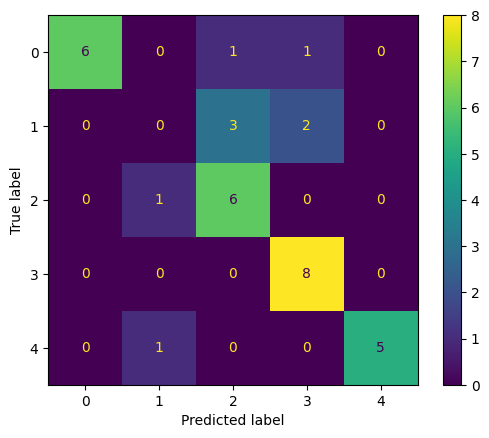


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['disgust(2)', 'fear(3)']
Hard cases of false positives: ['disgust(2)', 'happiness(4)']

Label: disgust(2)
Hard cases of false positives: ['boredom(1)']



In [29]:
# select the features
df_5emos_3_ep = df_5emos.filter(regex='energy_|pitch_|label')

# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_5emos_3_ep, test_size=0.1)

# train the model
svm_model = SVC(kernel='rbf')
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

We get 73.53% test accuracy compared to 66.02% recognition rate with 5 emotions and 90-10 train-test split in paper 3.
### 2) Only LPCMFCC


Evaluation: f1_score
42.03% for the train data
31.27% for the test data

Evaluation: accuracy_score
51.56% for the train data
44.44% for the test data

Evaluation: precision_score
49.92% for the train data
29.36% for the test data

Evaluation: recall_score
45.30% for the train data
37.51% for the test data

Evaluation: confusion_matrix of test predictions


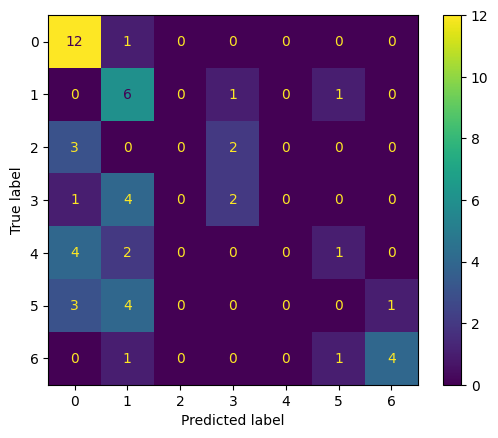


Hard cases for the model:

Label: boredom(1)
Hard cases of false positives: ['fear(3)', 'neutral(5)']

Label: disgust(2)
Hard cases of false negatives: ['anger(0)', 'fear(3)']

Label: fear(3)
Hard cases of false negatives: ['boredom(1)']
Hard cases of false positives: ['disgust(2)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)', 'boredom(1)']

Label: neutral(5)
Hard cases of false negatives: ['anger(0)', 'boredom(1)']
Hard cases of false positives: ['boredom(1)', 'happiness(4)', 'sadness(6)']



In [30]:
# select the features
df_3_lpcmfcc = df_3.filter(regex='lpcmfccs_|label')

# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_3_lpcmfcc, verbose=False, test_size=0.1)

# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)


Evaluation: f1_score
57.28% for the train data
50.51% for the test data

Evaluation: accuracy_score
58.21% for the train data
51.85% for the test data

Evaluation: precision_score
58.56% for the train data
51.29% for the test data

Evaluation: recall_score
58.07% for the train data
51.63% for the test data

Evaluation: confusion_matrix of test predictions


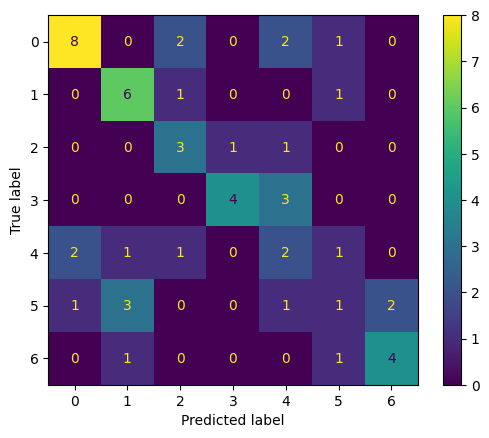


Hard cases for the model:

Label: boredom(1)
Hard cases of false positives: ['neutral(5)']

Label: disgust(2)
Hard cases of false positives: ['anger(0)']

Label: fear(3)
Hard cases of false negatives: ['happiness(4)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']
Hard cases of false positives: ['anger(0)', 'fear(3)']

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)', 'sadness(6)']

Label: sadness(6)
Hard cases of false positives: ['neutral(5)']



In [31]:
# change the model's hyperparameter
# train the model
svm_model = SVC(C=1, gamma=0.1, class_weight='balanced', decision_function_shape='ovo')
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

Especially balancing but also the other hyperparamaters can improve the model. Nevertheless, we are not as good as in paper 3. 
<br>  How about when we only use 5 emotions?
#### 5 emos only


Evaluation: f1_score
62.34% for the train data
54.97% for the test data

Evaluation: accuracy_score
61.97% for the train data
52.94% for the test data

Evaluation: precision_score
63.42% for the train data
57.90% for the test data

Evaluation: recall_score
63.75% for the train data
56.71% for the test data

Evaluation: confusion_matrix of test predictions


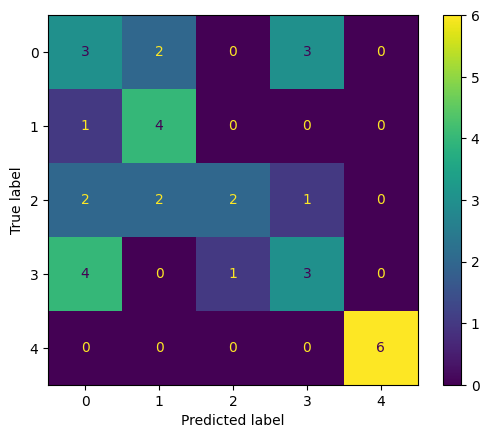


Hard cases for the model:

Label: boredom(0)
Hard cases of false negatives: ['disgust(1)', 'neutral(3)']
Hard cases of false positives: ['neutral(3)']

Label: disgust(1)
Hard cases of false positives: ['boredom(0)', 'happiness(2)']

Label: happiness(2)
Hard cases of false negatives: ['boredom(0)', 'disgust(1)']
Hard cases of false positives: ['neutral(3)']

Label: neutral(3)
Hard cases of false negatives: ['boredom(0)']
Hard cases of false positives: ['boredom(0)']



In [32]:
# load the train/test data
df_5emos_lpcmfccs = df_5emos.filter(regex='lpcmfccs_|label')
X_train, X_test, y_train, y_test = load_train_test_data(df_5emos_lpcmfccs, test_size=0.1, verbose=False)

# train the model
svm_model = SVC(C=1, gamma=0.1, class_weight='balanced', decision_function_shape='ovo')
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True, emotions='5emos')

The LPCMFCC features alone don't seem to be very good or at least not sufficient enough. The model has a hard time at predicting emotions other than *anger* and *boredom*. We get 52.94% test accuracy compared to 70.7% recognition rate with 5 emotions and 90-10 train-test split in paper 3.

### 3) energy, pitch, LPCC, MFCC


Evaluation: f1_score
95.49% for the train data
76.40% for the test data

Evaluation: accuracy_score
95.43% for the train data
77.78% for the test data

Evaluation: precision_score
96.27% for the train data
79.59% for the test data

Evaluation: recall_score
94.89% for the train data
75.37% for the test data

Evaluation: confusion_matrix of test predictions


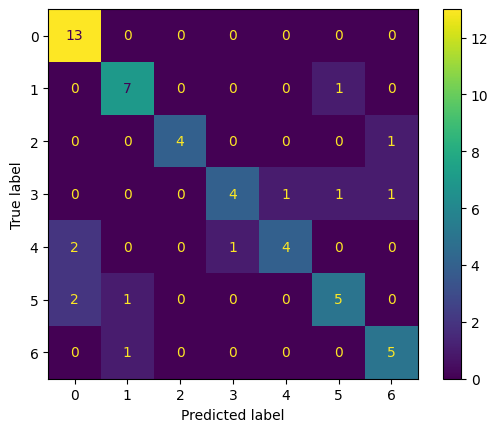


Hard cases for the model:

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['anger(0)']



In [33]:
# select the features
df_3_eplm = df_3.filter(regex='energy_|pitch_|lpccs_|^mfccs|label')

# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_3_eplm, verbose=False, test_size=0.1)

# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)


Evaluation: f1_score
95.58% for the train data
76.79% for the test data

Evaluation: accuracy_score
95.45% for the train data
77.64% for the test data

Evaluation: precision_score
96.41% for the train data
79.28% for the test data

Evaluation: recall_score
94.98% for the train data
75.67% for the test data

Evaluation: confusion_matrix of test predictions


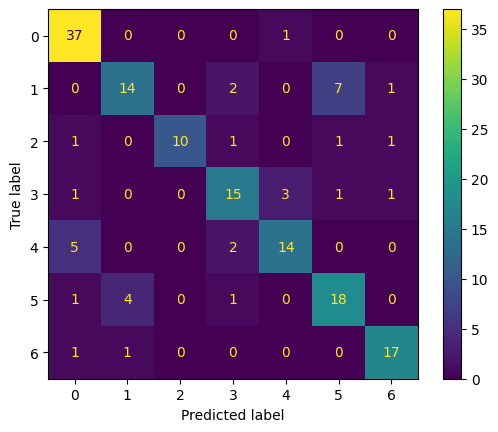


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']
Hard cases of false positives: ['neutral(5)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']

Label: neutral(5)
Hard cases of false positives: ['boredom(1)']



In [34]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_3_eplm, verbose=False, test_size=0.3)

# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

We get a slightly better generalization with a 70-30 split.

#### 90-10 split with 5 emos only


Evaluation: f1_score
98.33% for the train data
91.76% for the test data

Evaluation: accuracy_score
98.03% for the train data
91.18% for the test data

Evaluation: precision_score
98.33% for the train data
94.55% for the test data

Evaluation: recall_score
98.33% for the train data
91.00% for the test data

Evaluation: confusion_matrix of test predictions


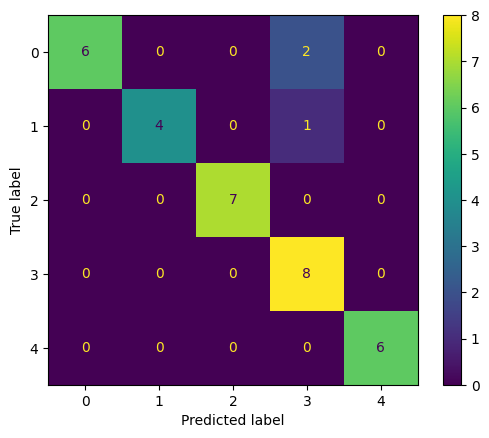


Hard cases for the model:

Label: anger(0)
Hard cases of false negatives: ['fear(3)']



In [35]:
# select the features
df_5emos_3_eplm = df_5emos.filter(regex='energy_|pitch_|lpccs_|^mfccs|label')

# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_5emos_3_eplm, verbose=False, test_size=0.1)

# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

These are very good results with a 90-10 split and 5 emotions only as in the paper! We get 91.18% test accuracy compared to 78.17% recognition rate in the paper.

### 4) energy, pitch, LPCMFCC


Evaluation: f1_score
77.35% for the train data
56.63% for the test data

Evaluation: accuracy_score
78.38% for the train data
61.11% for the test data

Evaluation: precision_score
80.61% for the train data
64.64% for the test data

Evaluation: recall_score
76.00% for the train data
55.20% for the test data

Evaluation: confusion_matrix of test predictions


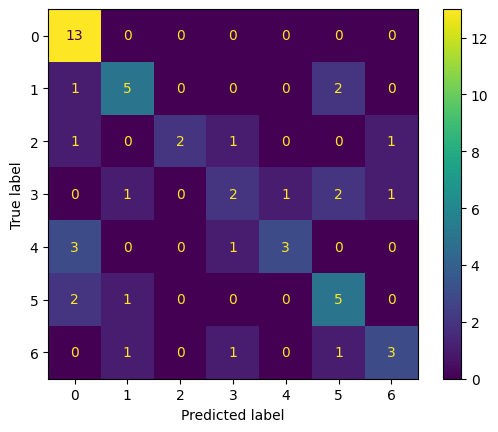


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']

Label: fear(3)
Hard cases of false negatives: ['neutral(5)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']
Hard cases of false positives: ['fear(3)']

Label: neutral(5)
Hard cases of false negatives: ['anger(0)']



In [36]:
# select the features
df_3_eplpcmfcc = df_3.filter(regex='energy_|pitch_|lpcmfccs_|label')

# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_3_eplpcmfcc, verbose=False, test_size=0.1)

# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

#### 5 emos only


Evaluation: f1_score
86.94% for the train data
82.91% for the test data

Evaluation: accuracy_score
86.56% for the train data
85.29% for the test data

Evaluation: precision_score
87.58% for the train data
90.10% for the test data

Evaluation: recall_score
86.49% for the train data
83.00% for the test data

Evaluation: confusion_matrix of test predictions


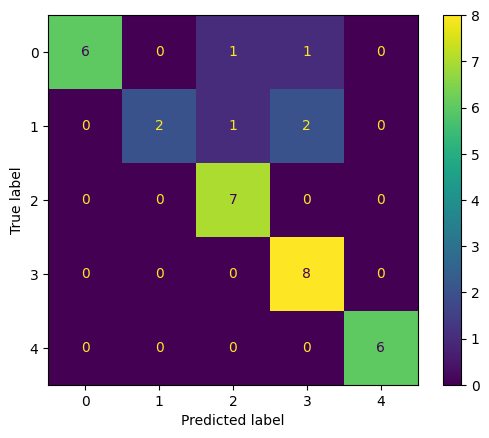


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['fear(3)']



In [37]:
# select the features
df_5emos_3_eplpcmfcc = df_5emos.filter(regex='energy_|pitch_|lpcmfccs_|label')

# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_5emos_3_eplpcmfcc, verbose=False, test_size=0.1)

# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

Finally, it seems like the model with Energy, pitch, lpccs, and mfccs is the strongest. It could be that the computation of lpcmfccs is not sufficient enough to hold both advantages of lpccs and mfccs in this case. We will try if further finetuning for the best model still increases its performance.

### Hyperparameter Optimization best model 

In [39]:
# train model on best features again

# select the features
df_3_eplm = df_3.filter(regex='energy_|pitch_|lpccs_|^mfccs|label')

# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_3_eplm, verbose=False, test_size=0.3)

# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# define the grid for the hyperparameter search
grid_vals = { 'C': [0.01, 0.1, 1, 10], 
            'gamma': [0.01, 0.1, 1, 10, 'scale', 'auto'],
            'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
            'class_weight': ['balanced', None], 
            'decision_function_shape': ['ovo', 'ovr']
            }

run_gridsearchCV(svm_model, grid_vals, X_train, y_train, name_spec='paper3')

Fitting 5 folds for each of 384 candidates, totalling 1920 fits
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=0.01, kernel=linear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=0.01, kernel=linear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=0.01, kernel=linear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=0.01, kernel=linear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=0.01, kernel=linear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END C=0.01, class_we

[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=scale, kernel=linear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=scale, kernel=linear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovo, gamma=scale, kerne

[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=1, kernel=line

[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=sig

[CV] END C=0.01, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight

[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_w

[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01

[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=sigmoid; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=sigmoid; total time=   0.0s
[CV] E

[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[C

[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=scale, kernel=sigmoid; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=linear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=linear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=linear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=linear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=linear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=rbf; 

[CV] END C=0.1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=linear; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=linear; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=linear; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=linear; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision

[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=0.1, class_weight=None, decisio

[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.1, class_weight=Non

[CV] END C=1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=linear; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=linear; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=1, class_weight=ba

[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=1, class_we

[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=linear; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=linear; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=linear; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END 

[CV] END C=1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=linear; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovo, gamma

[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape

[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=1, class_weight=None, decision_function

[CV] END C=10, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=linear; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=linear; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=linear; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=linear; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=10, c

[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=10, 

[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=balanced, decision_function_shape=ovr, gamma=auto, kernel=sigmoid; total time=   0.0s
[

[CV] END C=10, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovo, gamma=10, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ov

[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=None, decision_functio

[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=None, decision_function_shape=ovr, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=10, class_weight=None, decision


Evaluation: f1_score
89.94% for the train data
76.68% for the test data

Evaluation: accuracy_score
89.84% for the train data
77.64% for the test data

Evaluation: precision_score
89.87% for the train data
77.77% for the test data

Evaluation: recall_score
90.05% for the train data
76.27% for the test data

Evaluation: confusion_matrix of test predictions


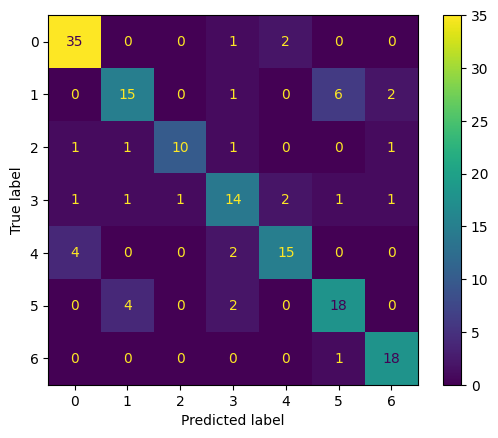


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']

Label: neutral(5)
Hard cases of false positives: ['boredom(1)']



In [39]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_3_eplm, verbose=False, test_size=0.3)

svm_best_model_paper3 = load_model('SVC', 'f1_macro', name_spec='paper3')
model_eval(svm_best_model_paper3, X_train, X_test, y_train, y_test, confusion=True)

In [40]:
params_best_svm = svm_best_model_paper3.get_params()
params_best_svm

{'C': 0.01,
 'break_ties': False,
 'cache_size': 200,
 'class_weight': 'balanced',
 'coef0': 0.0,
 'decision_function_shape': 'ovo',
 'degree': 3,
 'gamma': 0.01,
 'kernel': 'linear',
 'max_iter': -1,
 'probability': False,
 'random_state': None,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

Even though we already achieve quite good results, we can still see that the model is overfitting to our data. Therefore, we will apply some dimensionality reduction/ feature selection.
## Dimensionality Reduction (Feature Selection)
For this, we also load the whole dataset with all statistics.

In [41]:
# load the data
df = pd.read_pickle('../results/df_prep_numerical_only.pkl')
print(df.columns)
df_all_stats = pd.read_pickle('../results/df_prep_numerical_only_all_stats.pkl')
print(df_all_stats.columns)

Index(['duration', 'mean', 'median', 'max', 'min', 'var', 'std',
       'speaking_rate', 'articulation_rate', 'asd',
       ...
       'lpc_local2_min', 'lpc_local3_mean', 'lpc_local3_var', 'lpc_local3_max',
       'lpc_local3_min', 'lpc_local4_mean', 'lpc_local4_var', 'lpc_local4_max',
       'lpc_local4_min', 'label'],
      dtype='object', length=270)
Index(['duration', 'mean', 'median', 'max', 'min', 'var', 'std',
       'speaking_rate', 'articulation_rate', 'asd',
       ...
       'value_rising_energy_iqr', 'value_falling_energy_iqr',
       'duration_rising_pitch_iqr', 'duration_falling_pitch_iqr',
       'value_rising_pitch_iqr', 'value_falling_pitch_iqr', 'skew_log_pitch',
       'range_log_pitch', 'range_log_energy', 'label'],
      dtype='object', length=596)


### 1) PCA

In [42]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_3, verbose=False, test_size=0.1)

In [43]:
# apply PCA to the data
pca = PCA(0.9)
X_train = pca.fit_transform(X_train)

# apply to test set
X_test = pca.transform(X_test)

In [44]:
len(pca.explained_variance_ratio_)

34

In [45]:
pca.explained_variance_ratio_.sum()

0.902287446504693


Evaluation: f1_score
88.46% for the train data
74.97% for the test data

Evaluation: accuracy_score
88.57% for the train data
75.93% for the test data

Evaluation: precision_score
89.99% for the train data
78.96% for the test data

Evaluation: recall_score
87.56% for the train data
74.02% for the test data

Evaluation: confusion_matrix of test predictions


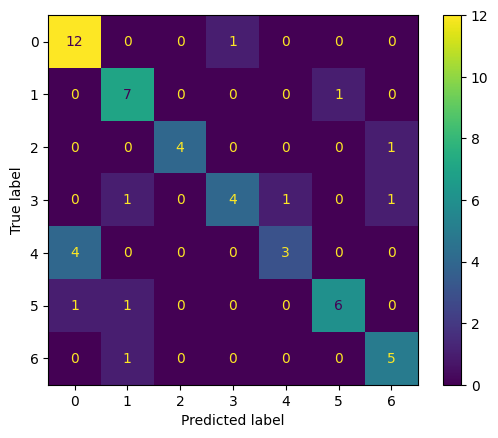


Hard cases for the model:

Label: anger(0)
Hard cases of false positives: ['happiness(4)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']
Hard cases of false positives: ['fear(3)']



In [46]:
# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

Keeping 90% variance, we can end up with a good result for train and test data while using only 34 principal components instead of 186 features! (88.46% compared to 93.72% F1 macro for train, 74.35% compared to 75.45% F1 macro for test

In [47]:
# try with all created numerical features:

# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df, verbose=False, test_size=0.1)

# apply PCA to the data
pca = PCA(0.9)
X_train = pca.fit_transform(X_train)

# apply to test set
X_test = pca.transform(X_test)

In [48]:
print(len(pca.explained_variance_ratio_))
print(pca.explained_variance_ratio_)

46
[0.23630045 0.12121378 0.06747595 0.05392803 0.04523777 0.03181093
 0.0293404  0.02483987 0.02155094 0.02033224 0.01874521 0.01649749
 0.01387926 0.01329232 0.01161029 0.01108638 0.01043137 0.01039349
 0.00897382 0.00845648 0.00807394 0.00742564 0.00713921 0.00690797
 0.0063459  0.00589911 0.00578705 0.00535635 0.00508252 0.00498293
 0.00486051 0.0045463  0.00446013 0.00442354 0.0042169  0.00413504
 0.00404761 0.00396081 0.00392244 0.00382537 0.00372707 0.00353915
 0.0034296  0.00329167 0.00321728 0.00315735]



Evaluation: f1_score
94.90% for the train data
82.78% for the test data

Evaluation: accuracy_score
94.80% for the train data
83.33% for the test data

Evaluation: precision_score
95.85% for the train data
86.49% for the test data

Evaluation: recall_score
94.20% for the train data
81.24% for the test data

Evaluation: confusion_matrix of test predictions


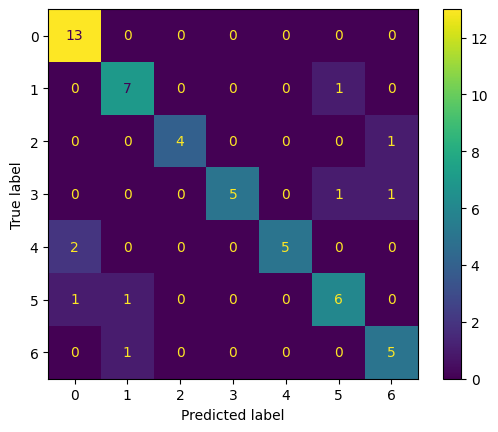


Hard cases for the model:

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']



In [49]:
# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

44
[0.24093311 0.12570975 0.06758132 0.04910128 0.04625722 0.03021554
 0.0298231  0.02628089 0.02121378 0.02057641 0.01835894 0.0164946
 0.01477938 0.01277606 0.01161749 0.01116885 0.01008775 0.00975222
 0.00929341 0.00837555 0.00824185 0.00749148 0.00736365 0.00681678
 0.00667335 0.00610181 0.00590683 0.00542256 0.00533348 0.00519782
 0.0047959  0.00473043 0.00469626 0.00456498 0.00441205 0.00427928
 0.00404478 0.00398151 0.00380122 0.00368532 0.00352788 0.00341824
 0.00326604 0.00320018]

Evaluation: f1_score
92.33% for the train data
78.76% for the test data

Evaluation: accuracy_score
92.51% for the train data
79.50% for the test data

Evaluation: precision_score
93.30% for the train data
82.19% for the test data

Evaluation: recall_score
91.76% for the train data
77.25% for the test data

Evaluation: confusion_matrix of test predictions


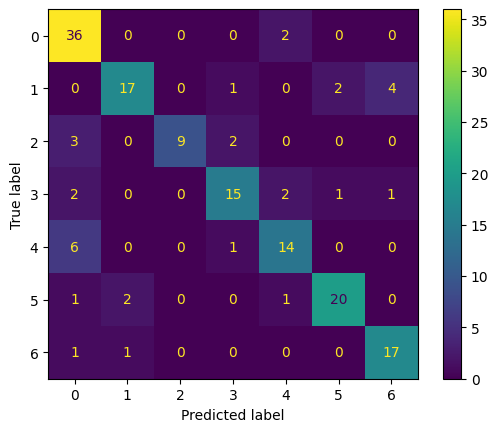


Hard cases for the model:

Label: disgust(2)
Hard cases of false negatives: ['anger(0)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']



In [50]:
# with changed train/test ratio

# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df, verbose=False, test_size=0.3)

# apply PCA to the data
pca = PCA(0.9)
X_train = pca.fit_transform(X_train)

# apply to test set
X_test = pca.transform(X_test)

print(len(pca.explained_variance_ratio_))
print(pca.explained_variance_ratio_)

# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

101
[0.13799096 0.12266711 0.04947093 0.04281926 0.03493211 0.03030257
 0.02698232 0.02142623 0.01957526 0.0173575  0.01581996 0.01508363
 0.01387887 0.01332931 0.01294983 0.01222729 0.01128415 0.01100176
 0.01038131 0.00952195 0.00895528 0.00829521 0.00801439 0.00769778
 0.00742357 0.00722719 0.00685052 0.00651202 0.00638704 0.00611637
 0.00598839 0.00566201 0.00553018 0.00531676 0.00516693 0.00479341
 0.00467514 0.00465817 0.00452899 0.0043665  0.00423001 0.0041574
 0.00402673 0.00394643 0.00382919 0.00373378 0.00365151 0.00356369
 0.0034648  0.00333513 0.00328311 0.00318693 0.00311785 0.00308005
 0.00299072 0.00298275 0.00289692 0.00284276 0.00282787 0.00268512
 0.00264738 0.00262502 0.002561   0.00251743 0.00246268 0.00242187
 0.0023864  0.00237287 0.00230823 0.00226894 0.00222751 0.00219788
 0.00216714 0.00211796 0.00211125 0.00208273 0.00202058 0.00197826
 0.00196447 0.00192523 0.0018972  0.00187489 0.00183165 0.00180176
 0.0017698  0.00175942 0.00175371 0.00173642 0.00170543 0.0

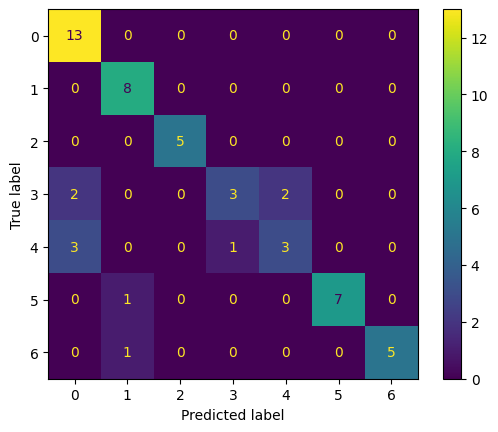


Hard cases for the model:

Label: fear(3)
Hard cases of false negatives: ['anger(0)', 'happiness(4)']
Hard cases of false positives: ['happiness(4)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']
Hard cases of false positives: ['fear(3)']



In [51]:
# and with all statistical features

# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_all_stats, verbose=False, test_size=0.1)

# apply PCA to the data
pca = PCA(0.9)
X_train = pca.fit_transform(X_train)

# apply to test set
X_test = pca.transform(X_test)

print(len(pca.explained_variance_ratio_))
print(pca.explained_variance_ratio_)

# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

93
[0.14025347 0.12536634 0.04975467 0.04029462 0.03550909 0.03096622
 0.02774303 0.02152726 0.01944987 0.01881874 0.01603927 0.01501813
 0.01444586 0.01399949 0.01328007 0.01279356 0.01143751 0.01092915
 0.01035224 0.00991927 0.00886862 0.00857667 0.00784338 0.00769331
 0.00746426 0.00738979 0.00710265 0.00677475 0.00662896 0.00617052
 0.00604572 0.00567396 0.00543243 0.00536949 0.00509872 0.00498552
 0.00477809 0.00467747 0.00457931 0.00439264 0.00422635 0.0041923
 0.00407849 0.00402868 0.00394612 0.00383104 0.00367931 0.00356922
 0.00349268 0.00345961 0.00339864 0.00330013 0.00326452 0.00314981
 0.00311479 0.003023   0.0030048  0.00294144 0.00282258 0.00280026
 0.00268727 0.00261211 0.0025476  0.00252039 0.00246527 0.002458
 0.00242648 0.00236498 0.00230059 0.00226093 0.00223386 0.00220421
 0.00218461 0.00211093 0.00205387 0.00201508 0.00197406 0.00196208
 0.00194172 0.00192069 0.00190602 0.00187855 0.00183502 0.00180315
 0.00178887 0.00175549 0.00174664 0.00170997 0.00169774 0.0016

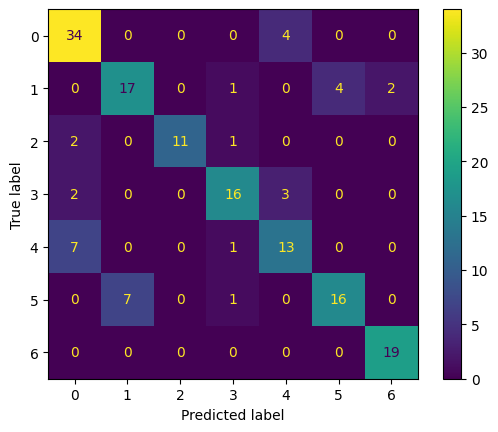


Hard cases for the model:

Label: boredom(1)
Hard cases of false positives: ['neutral(5)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)']



In [52]:
# and with all statistical features

# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_all_stats, verbose=False, test_size=0.3)

# apply PCA to the data
pca = PCA(0.9)
X_train = pca.fit_transform(X_train)

# apply to test set
X_test = pca.transform(X_test)

print(len(pca.explained_variance_ratio_))
print(pca.explained_variance_ratio_)

# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

In [74]:
# save pca for later
pickle.dump(pca, open('../results/pca.pkl','wb'))

### 2) Featurewiz
Selection on test_size 0.1

In [59]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_3, verbose=False, test_size=0.1)

wiz = FeatureWiz(verbose=1)
        X_train_selected = wiz.fit_transform(X_train, y_train)
        X_test_selected = wiz.transform(X_test)
        wiz.features  ### provides a list of selected features ###            
        
############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
featurewiz has selected 0.7 as the correlation limit. Change this limit to fit your needs...
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Multi_Classification problem ####
    Loaded train data. Shape = (481, 187)
#### Single_Label Multi_Classification problem ####
No test data filename give

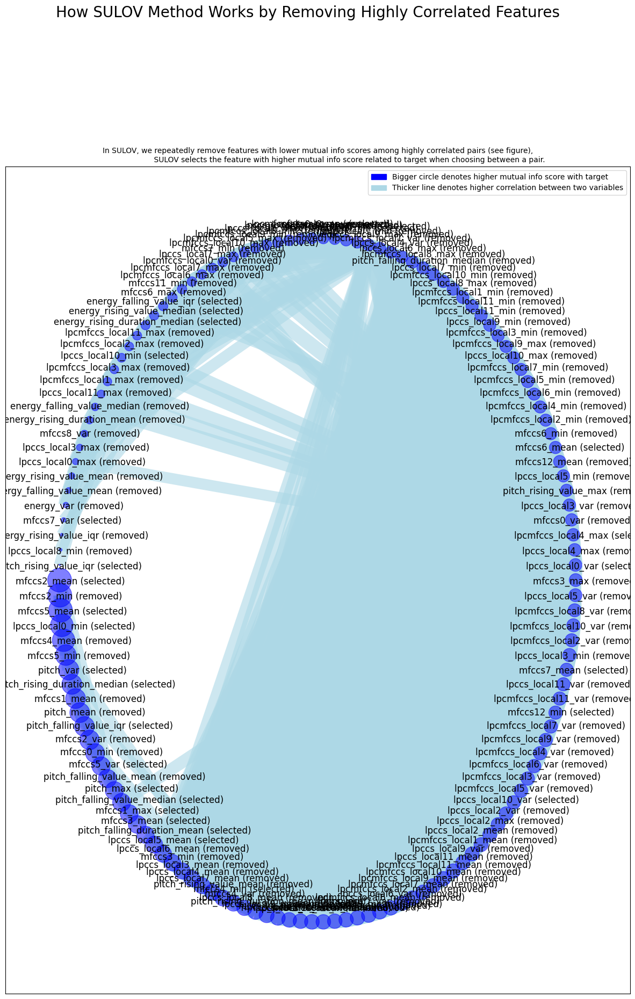

Time taken for SULOV method = 6 seconds
    Adding 0 categorical variables to reduced numeric variables  of 75
Finally 75 vars selected after SULOV
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
    Taking top 37 features per iteration...
    XGBoost version using 1.7.5 as tree method: hist
    Number of booster rounds = 100
            Time taken for regular XGBoost feature selection = 1 seconds
            Time taken for regular XGBoost feature selection = 1 seconds
            Time taken for regular XGBoost feature selection = 1 seconds
        Selected: ['mfccs2_mean', 'mfccs5_mean', 'lpccs_local5_mean', 'pitch_falling_duration_mean', 'pitch_var', 'mfccs1_max', 'lpccs_local0_min',

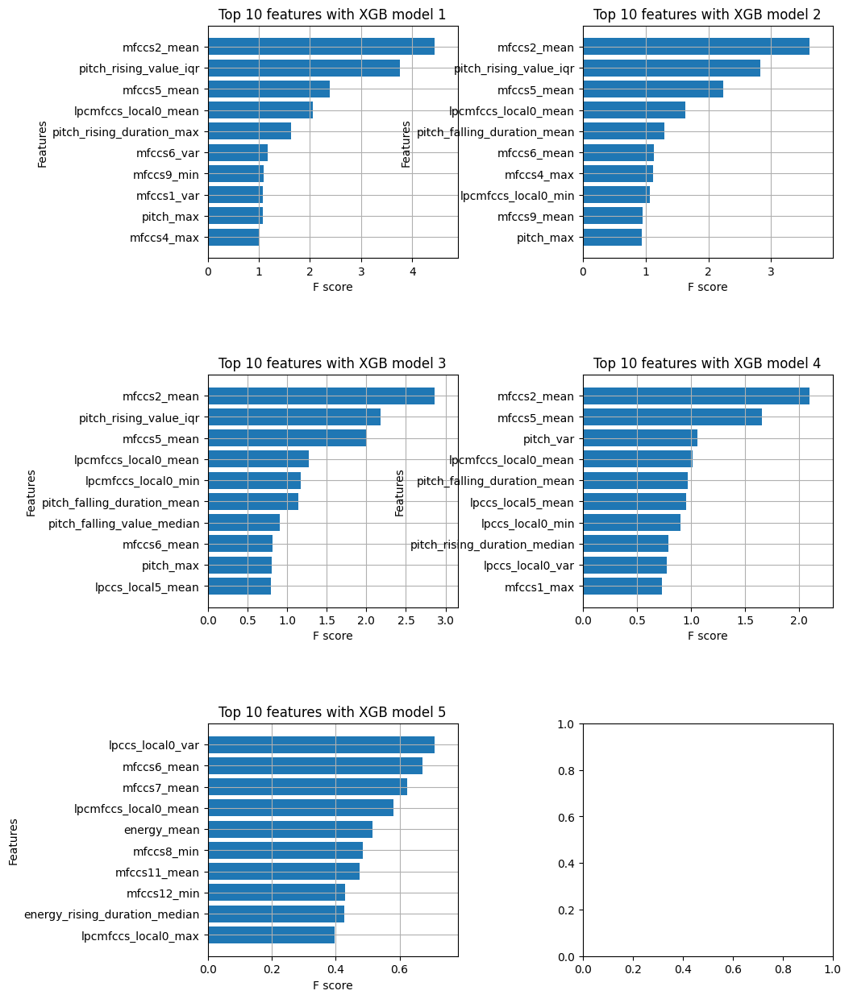

    Completed XGBoost feature selection in 3 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 55 important features. Too many to print...
Total Time taken for featurewiz selection = 13 seconds
Output contains a list of 55 important features and a train dataframe
    Time taken to create entire pipeline = 14 second(s)


In [60]:
# automatic feature selection using featurewiz package
fwiz = FeatureWiz(corr_limit=0.7, feature_engg='', category_encoders='', dask_xgboost_flag=False, nrows=None, verbose=2)

X_train = fwiz.fit_transform(X_train, y_train)
X_test = fwiz.transform(X_test)

# get list of selected features
selected_features_df3 = fwiz.features  

In [61]:
selected_features_df3

['mfccs2_mean',
 'mfccs5_mean',
 'pitch_rising_value_iqr',
 'pitch_rising_duration_max',
 'lpcmfccs_local0_mean',
 'energy_falling_duration_mean',
 'mfccs4_max',
 'mfccs6_mean',
 'lpccs_local5_mean',
 'pitch_max',
 'mfccs1_var',
 'mfccs6_var',
 'mfccs9_min',
 'mfccs9_mean',
 'pitch_falling_duration_mean',
 'lpcmfccs_local0_min',
 'lpccs_local0_min',
 'pitch_rising_duration_iqr',
 'pitch_rising_value_median',
 'mfccs7_mean',
 'mfccs10_mean',
 'lpccs_local2_min',
 'mfccs8_mean',
 'pitch_rising_duration_median',
 'mfccs3_var',
 'mfccs1_max',
 'mfccs11_var',
 'lpccs_local10_min',
 'energy_falling_value_max',
 'pitch_falling_value_median',
 'mfccs9_var',
 'mfccs0_max',
 'lpccs_local0_var',
 'mfccs3_mean',
 'energy_mean',
 'pitch_var',
 'energy_rising_value_max',
 'lpcmfccs_local0_max',
 'mfccs10_max',
 'mfccs12_min',
 'mfccs2_max',
 'mfccs5_var',
 'lpccs_local10_var',
 'mfccs12_var',
 'mfccs8_min',
 'mfccs7_var',
 'mfccs4_min',
 'lpccs_local1_var',
 'energy_rising_value_median',
 'lpcmfccs_


Evaluation: f1_score
96.30% for the train data
68.50% for the test data

Evaluation: accuracy_score
96.05% for the train data
70.37% for the test data

Evaluation: precision_score
96.81% for the train data
76.90% for the test data

Evaluation: recall_score
95.92% for the train data
67.72% for the test data

Evaluation: confusion_matrix of test predictions


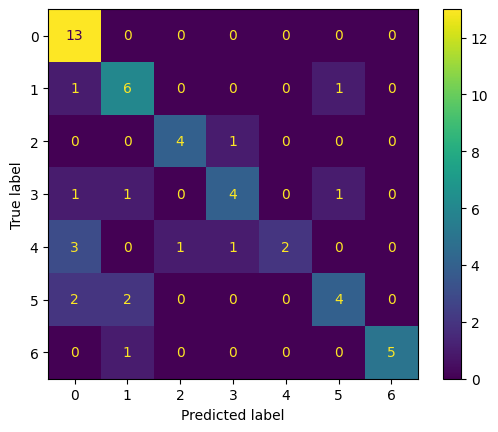


Hard cases for the model:

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['anger(0)', 'boredom(1)']



In [62]:
# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

Selection on test_size 0.3

wiz = FeatureWiz(verbose=1)
        X_train_selected = wiz.fit_transform(X_train, y_train)
        X_test_selected = wiz.transform(X_test)
        wiz.features  ### provides a list of selected features ###            
        
############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
featurewiz has selected 0.7 as the correlation limit. Change this limit to fit your needs...
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Multi_Classification problem ####
    Loaded train data. Shape = (374, 187)
#### Single_Label Multi_Classification problem ####
No test data filename give

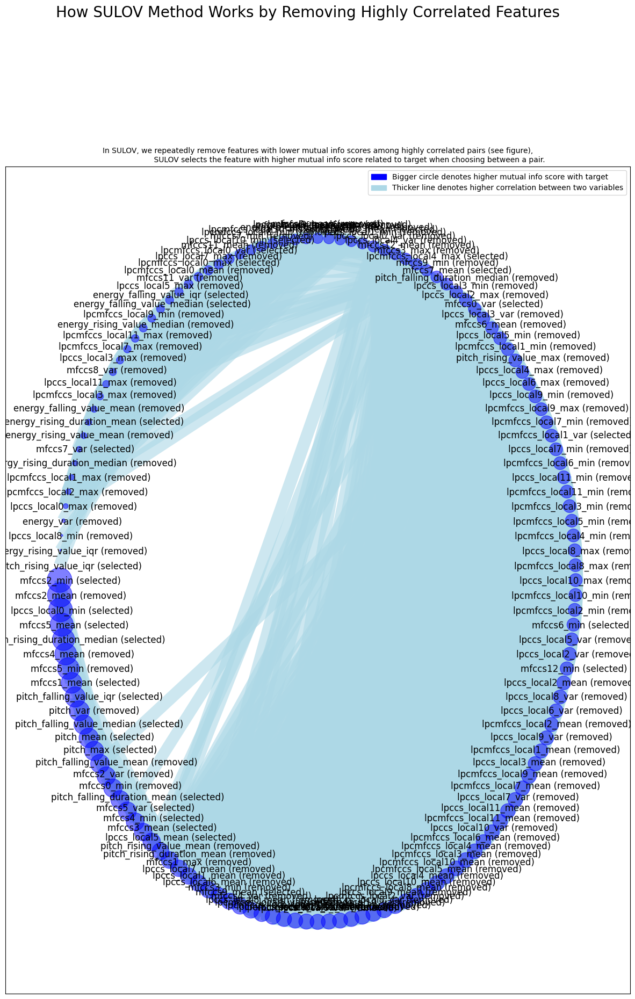

Time taken for SULOV method = 5 seconds
    Adding 0 categorical variables to reduced numeric variables  of 76
Finally 76 vars selected after SULOV
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
    Taking top 37 features per iteration...
    XGBoost version using 1.7.5 as tree method: hist
    Number of booster rounds = 100
            Time taken for regular XGBoost feature selection = 1 seconds
            Time taken for regular XGBoost feature selection = 1 seconds
            Time taken for regular XGBoost feature selection = 1 seconds
            Time taken for regular XGBoost feature selection = 1 seconds
        Selected: ['mfccs0_var', 'mfccs7_mean', 'lpccs_local0_mean', 'mfcc

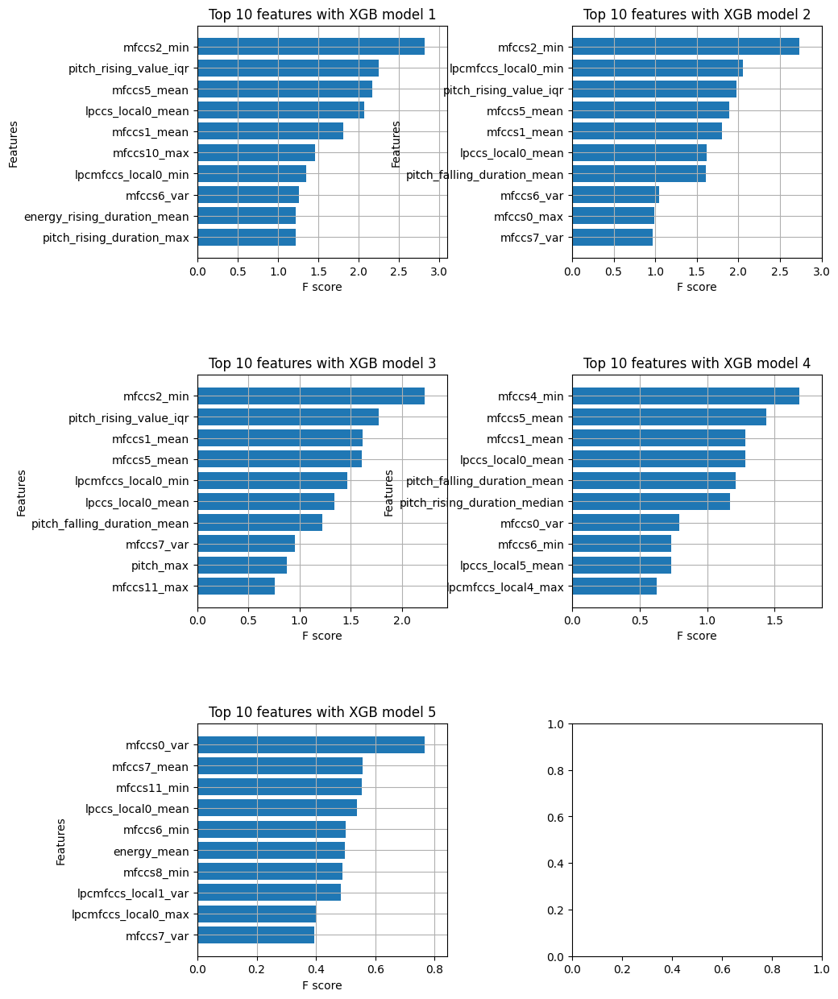

    Completed XGBoost feature selection in 2 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 61 important features. Too many to print...
Total Time taken for featurewiz selection = 12 seconds
Output contains a list of 61 important features and a train dataframe
    Time taken to create entire pipeline = 12 second(s)


In [63]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_3, verbose=False, test_size=0.3)

# automatic feature selection using featurewiz package
fwiz = FeatureWiz(corr_limit=0.7, feature_engg='', category_encoders='', dask_xgboost_flag=False, nrows=None, verbose=2)

X_train = fwiz.fit_transform(X_train, y_train)
X_test = fwiz.transform(X_test)

# get list of selected features
selected_features = fwiz.features  


Evaluation: f1_score
94.52% for the train data
73.84% for the test data

Evaluation: accuracy_score
94.39% for the train data
74.53% for the test data

Evaluation: precision_score
94.85% for the train data
76.25% for the test data

Evaluation: recall_score
94.30% for the train data
72.56% for the test data

Evaluation: confusion_matrix of test predictions


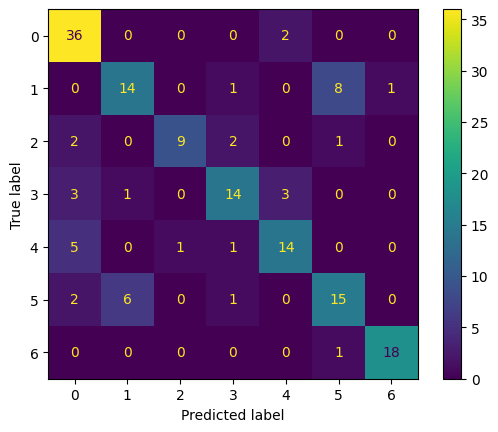


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']
Hard cases of false positives: ['neutral(5)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)']
Hard cases of false positives: ['boredom(1)']



In [64]:
# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

### try with created numerical features:

wiz = FeatureWiz(verbose=1)
        X_train_selected = wiz.fit_transform(X_train, y_train)
        X_test_selected = wiz.transform(X_test)
        wiz.features  ### provides a list of selected features ###            
        
############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
featurewiz has selected 0.7 as the correlation limit. Change this limit to fit your needs...
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Multi_Classification problem ####
    Loaded train data. Shape = (481, 270)
#### Single_Label Multi_Classification problem ####
No test data filename give

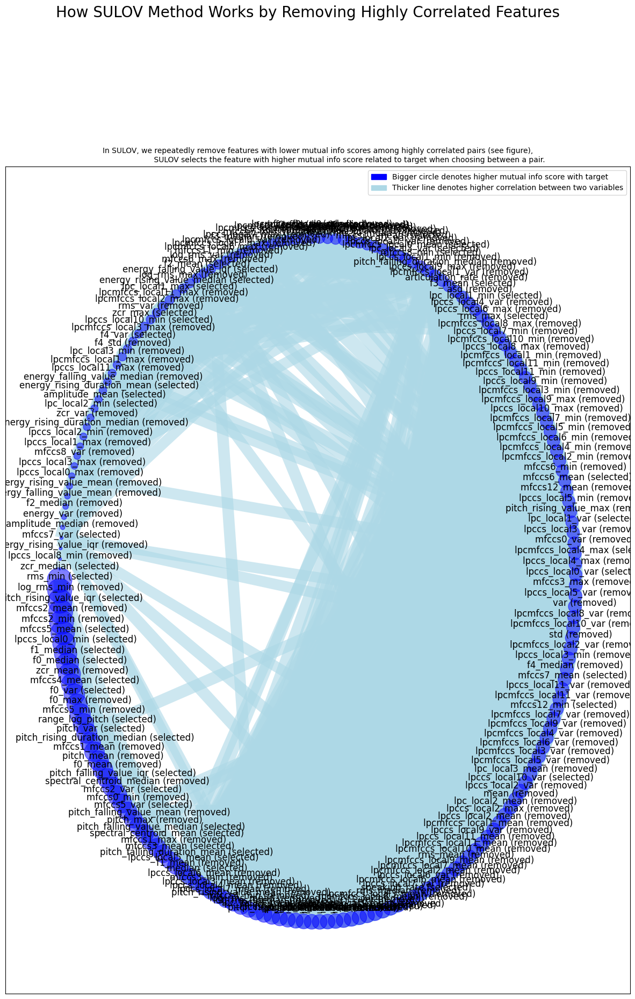

Time taken for SULOV method = 9 seconds
    Adding 0 categorical variables to reduced numeric variables  of 116
Finally 116 vars selected after SULOV
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
    Taking top 52 features per iteration...
    XGBoost version using 1.7.5 as tree method: hist
    Number of booster rounds = 100
            Time taken for regular XGBoost feature selection = 2 seconds
            Time taken for regular XGBoost feature selection = 2 seconds
            Time taken for regular XGBoost feature selection = 1 seconds
            Time taken for regular XGBoost feature selection = 1 seconds
        Selected: ['rms_max', 'mfccs6_mean', 'energy_mean', 'f3_mean', '

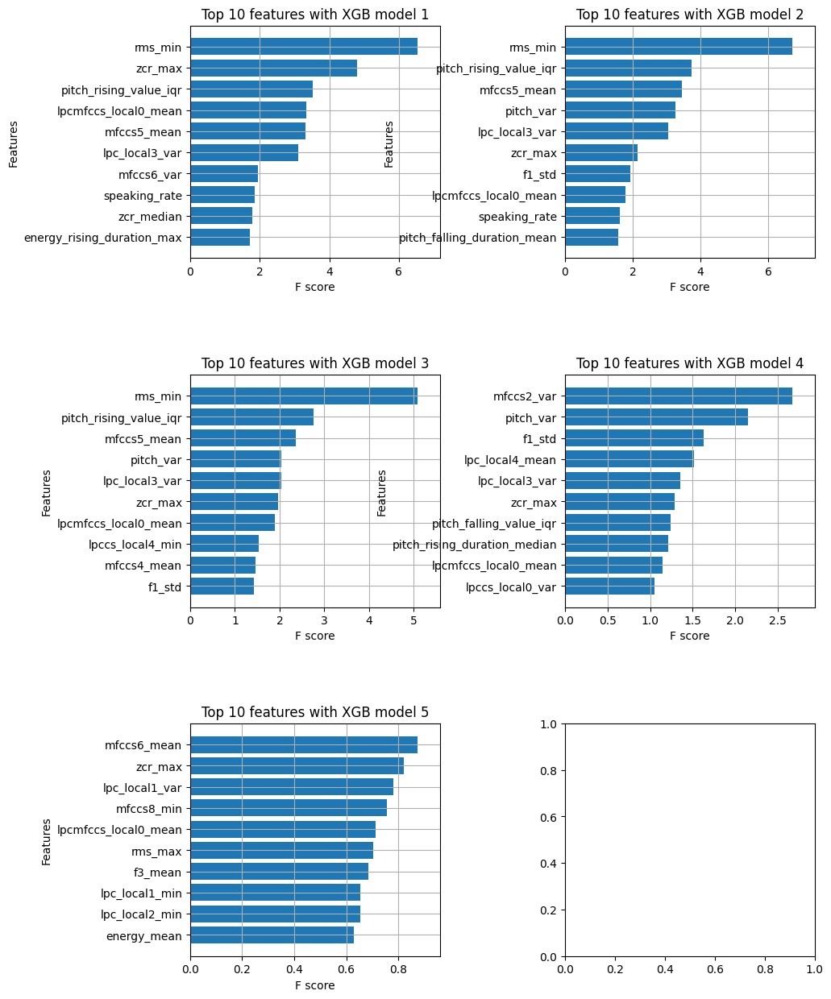

    Completed XGBoost feature selection in 2 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 89 important features. Too many to print...
Total Time taken for featurewiz selection = 19 seconds
Output contains a list of 89 important features and a train dataframe
    Time taken to create entire pipeline = 20 second(s)


In [65]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df, verbose=False, test_size=0.1)

# automatic feature selection using featurewiz package
fwiz = FeatureWiz(corr_limit=0.7, feature_engg='', category_encoders='', dask_xgboost_flag=False, nrows=None, verbose=2)

X_train = fwiz.fit_transform(X_train, y_train)
X_test = fwiz.transform(X_test)

# get list of selected features
selected_features = fwiz.features  

In [66]:
selected_features

['rms_min',
 'mfccs5_mean',
 'pitch_rising_value_iqr',
 'pitch_rising_duration_max',
 'speaking_rate',
 'zcr_median',
 'lpc_local4_mean',
 'mfccs4_mean',
 'f1_median',
 'skew_log_pitch',
 'lpcmfccs_local0_mean',
 'mfccs4_max',
 'energy_falling_duration_mean',
 'zcr_max',
 'duration',
 'mfccs6_var',
 'range_log_pitch',
 'f0_median',
 'mfccs6_mean',
 'lpc_local3_var',
 'pitch_rising_value_median',
 'lpc_local2_min',
 'mfccs1_var',
 'f4_mean',
 'pitch_falling_duration_mean',
 'mfccs2_var',
 'energy_falling_value_max',
 'pitch_rising_duration_iqr',
 'mfccs10_mean',
 'max',
 'amplitude_var',
 'mfccs9_min',
 'pitch_var',
 'pitch_rising_duration_median',
 'rms_max',
 'amplitude_min',
 'mfccs5_var',
 'median',
 'mfccs7_mean',
 'energy_rising_value_max',
 'mfccs9_mean',
 'lpcmfccs_local0_max',
 'mfccs7_var',
 'f2_var',
 'lpc_local4_min',
 'energy_falling_duration_max',
 'lpccs_local5_mean',
 'f1_max',
 'amplitude_mean',
 'mfccs11_mean',
 'energy_rising_duration_max',
 'energy_rising_duration_me


Evaluation: f1_score
97.41% for the train data
81.76% for the test data

Evaluation: accuracy_score
97.30% for the train data
83.33% for the test data

Evaluation: precision_score
97.95% for the train data
88.23% for the test data

Evaluation: recall_score
97.00% for the train data
79.91% for the test data

Evaluation: confusion_matrix of test predictions


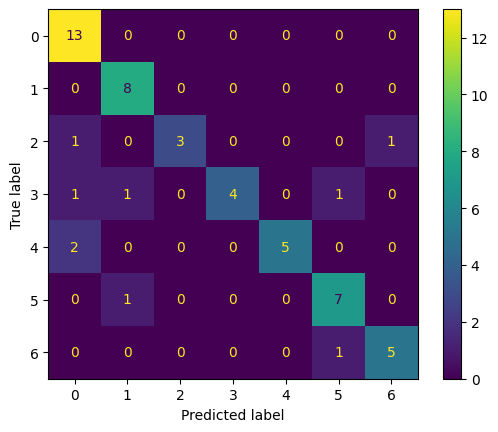


Hard cases for the model:

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']



In [67]:
# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

With only 89 features we can achieve 97.41% F1 macro for the train data and 81.76% F1 macro for the test data!

wiz = FeatureWiz(verbose=1)
        X_train_selected = wiz.fit_transform(X_train, y_train)
        X_test_selected = wiz.transform(X_test)
        wiz.features  ### provides a list of selected features ###            
        
############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
featurewiz has selected 0.7 as the correlation limit. Change this limit to fit your needs...
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Multi_Classification problem ####
    Loaded train data. Shape = (374, 270)
#### Single_Label Multi_Classification problem ####
No test data filename give

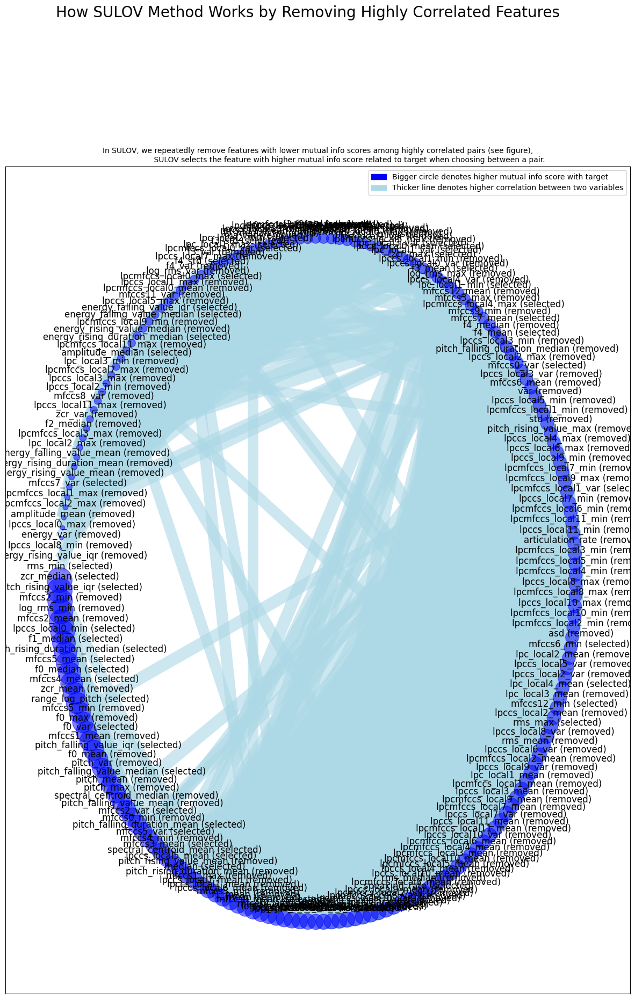

Time taken for SULOV method = 6 seconds
    Adding 0 categorical variables to reduced numeric variables  of 115
Finally 115 vars selected after SULOV
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
    Taking top 52 features per iteration...
    XGBoost version using 1.7.5 as tree method: hist
    Number of booster rounds = 100
            Time taken for regular XGBoost feature selection = 1 seconds
            Time taken for regular XGBoost feature selection = 1 seconds
            Time taken for regular XGBoost feature selection = 1 seconds
            Time taken for regular XGBoost feature selection = 1 seconds
        Selected: ['lpccs_local0_mean', 'lpc_local3_var', 'f3_std', 'lpc

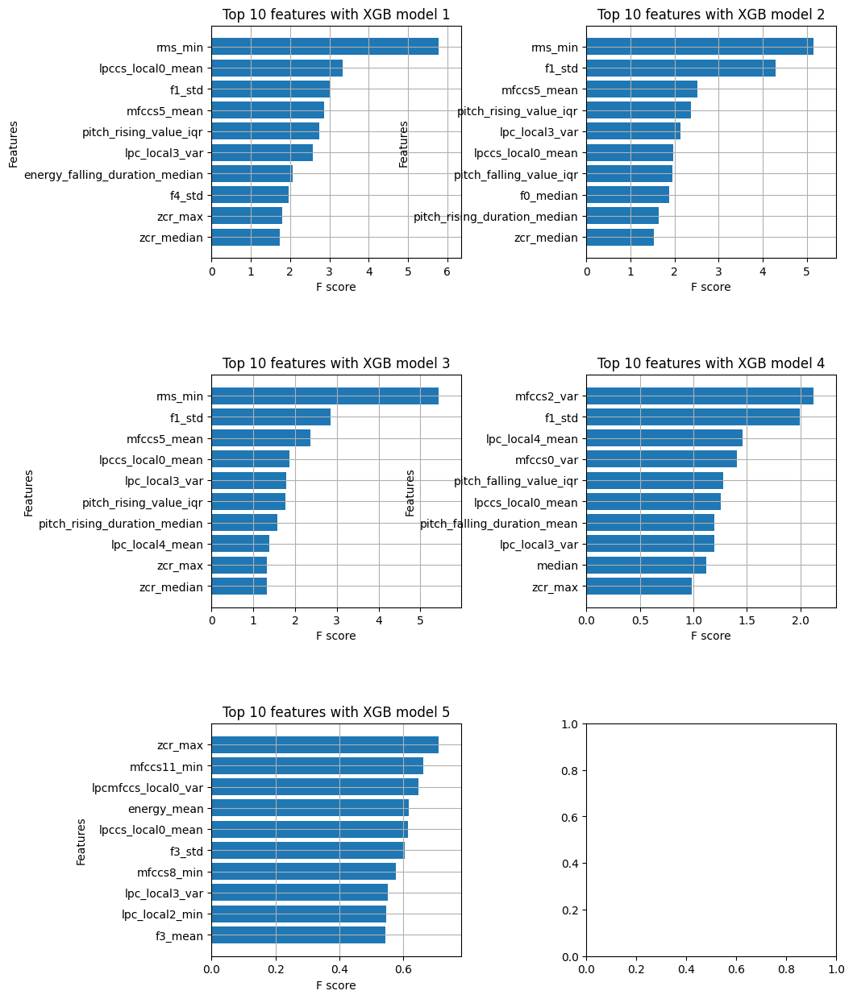

    Completed XGBoost feature selection in 4 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 87 important features. Too many to print...
Total Time taken for featurewiz selection = 15 seconds
Output contains a list of 87 important features and a train dataframe
    Time taken to create entire pipeline = 16 second(s)


In [68]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df, verbose=False, test_size=0.3)

# automatic feature selection using featurewiz package
fwiz = FeatureWiz(corr_limit=0.7, feature_engg='', category_encoders='', dask_xgboost_flag=False, nrows=None, verbose=2)

X_train = fwiz.fit_transform(X_train, y_train)
X_test = fwiz.transform(X_test)

# get list of selected features
selected_features = fwiz.features  


Evaluation: f1_score
97.46% for the train data
77.71% for the test data

Evaluation: accuracy_score
97.33% for the train data
78.26% for the test data

Evaluation: precision_score
97.98% for the train data
80.98% for the test data

Evaluation: recall_score
97.10% for the train data
76.22% for the test data

Evaluation: confusion_matrix of test predictions


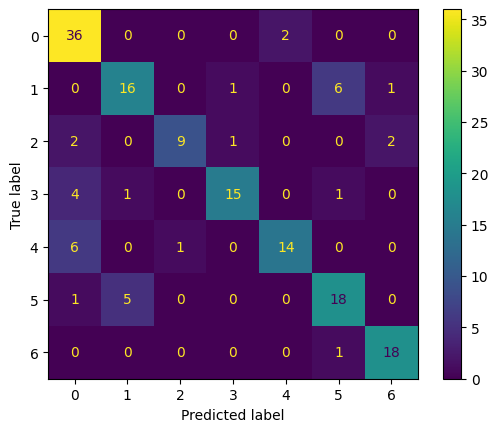


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']
Hard cases of false positives: ['neutral(5)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)']
Hard cases of false positives: ['boredom(1)']



In [69]:
# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

### try with created numerical features (all stats):

wiz = FeatureWiz(verbose=1)
        X_train_selected = wiz.fit_transform(X_train, y_train)
        X_test_selected = wiz.transform(X_test)
        wiz.features  ### provides a list of selected features ###            
        
############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
featurewiz has selected 0.7 as the correlation limit. Change this limit to fit your needs...
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Multi_Classification problem ####
    Loaded train data. Shape = (481, 596)
#### Single_Label Multi_Classification problem ####
No test data filename give

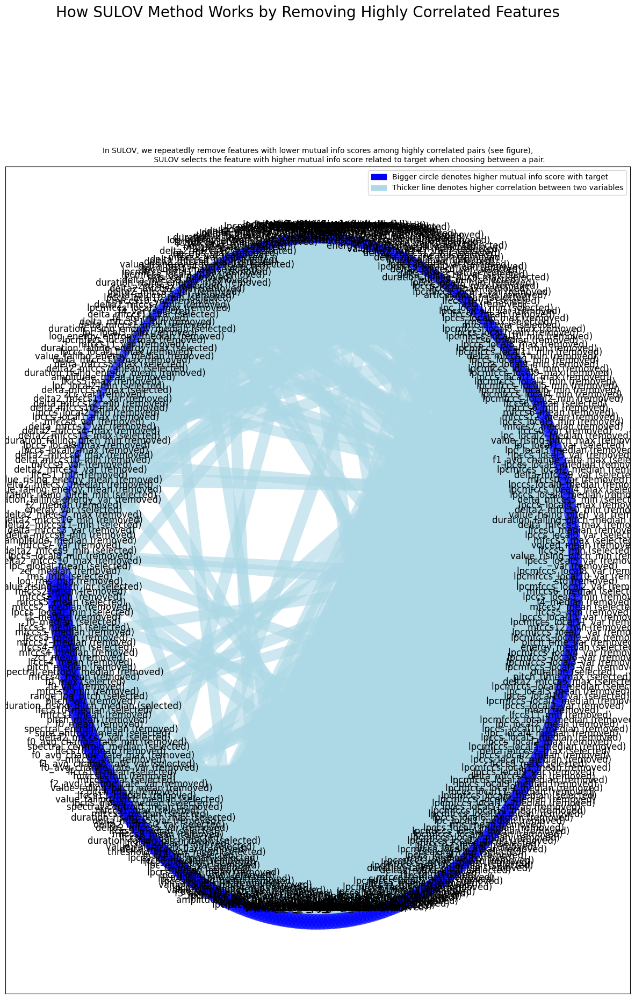

Time taken for SULOV method = 17 seconds
    Adding 0 categorical variables to reduced numeric variables  of 298
Finally 298 vars selected after SULOV
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
    Taking top 119 features per iteration...
    XGBoost version using 1.7.5 as tree method: hist
    Number of booster rounds = 100
            Time taken for regular XGBoost feature selection = 5 seconds
            Time taken for regular XGBoost feature selection = 4 seconds
            Time taken for regular XGBoost feature selection = 3 seconds
            Time taken for regular XGBoost feature selection = 2 seconds
            Time taken for regular XGBoost feature selection = 1 secon

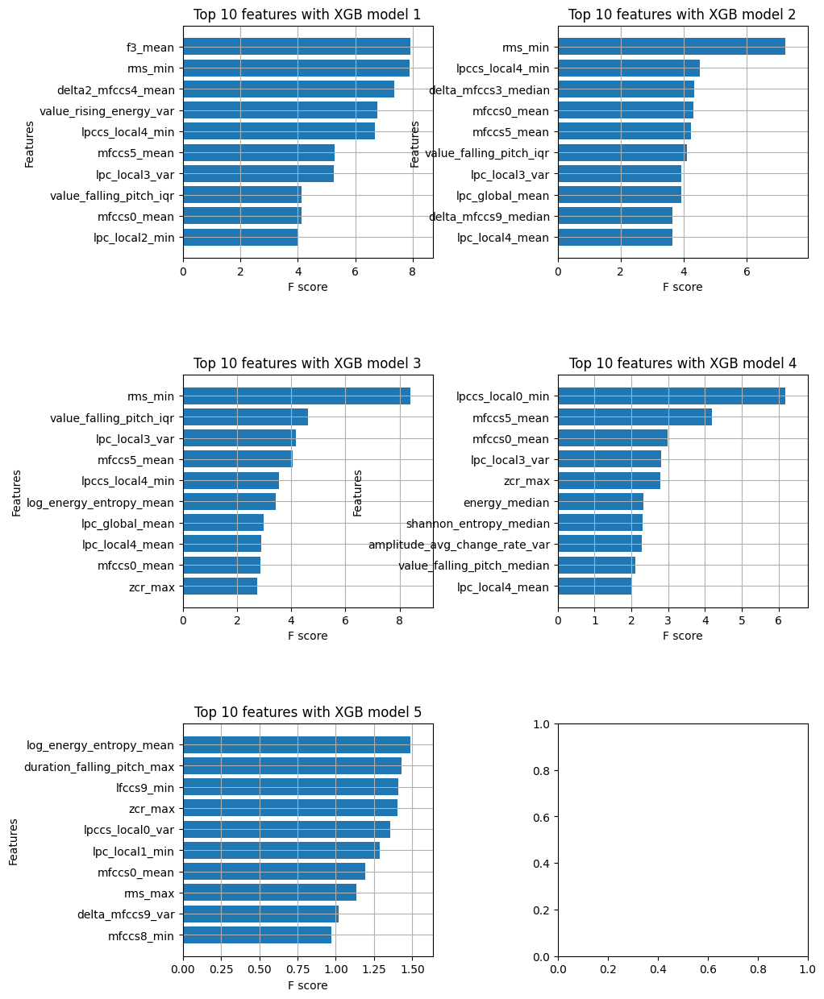

    Completed XGBoost feature selection in 3 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 219 important features. Too many to print...
Total Time taken for featurewiz selection = 35 seconds
Output contains a list of 219 important features and a train dataframe
    Time taken to create entire pipeline = 38 second(s)


In [70]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_all_stats, verbose=False, test_size=0.1)

# automatic feature selection using featurewiz package
fwiz = FeatureWiz(corr_limit=0.7, feature_engg='', category_encoders='', dask_xgboost_flag=False, nrows=None, verbose=2)

X_train = fwiz.fit_transform(X_train, y_train)
X_test = fwiz.transform(X_test)

# get list of selected features
selected_features = fwiz.features  


Evaluation: f1_score
99.06% for the train data
80.33% for the test data

Evaluation: accuracy_score
98.96% for the train data
81.48% for the test data

Evaluation: precision_score
99.29% for the train data
84.03% for the test data

Evaluation: recall_score
98.88% for the train data
78.95% for the test data

Evaluation: confusion_matrix of test predictions


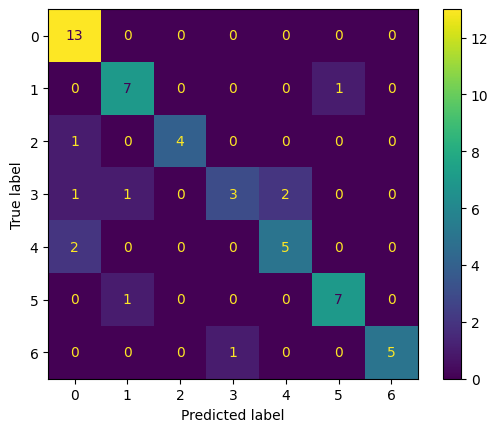


Hard cases for the model:

Label: fear(3)
Hard cases of false negatives: ['happiness(4)']
Hard cases of false positives: ['sadness(6)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']
Hard cases of false positives: ['fear(3)']



In [71]:
# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

wiz = FeatureWiz(verbose=1)
        X_train_selected = wiz.fit_transform(X_train, y_train)
        X_test_selected = wiz.transform(X_test)
        wiz.features  ### provides a list of selected features ###            
        
############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
featurewiz has selected 0.7 as the correlation limit. Change this limit to fit your needs...
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Multi_Classification problem ####
    Loaded train data. Shape = (374, 596)
#### Single_Label Multi_Classification problem ####
No test data filename give

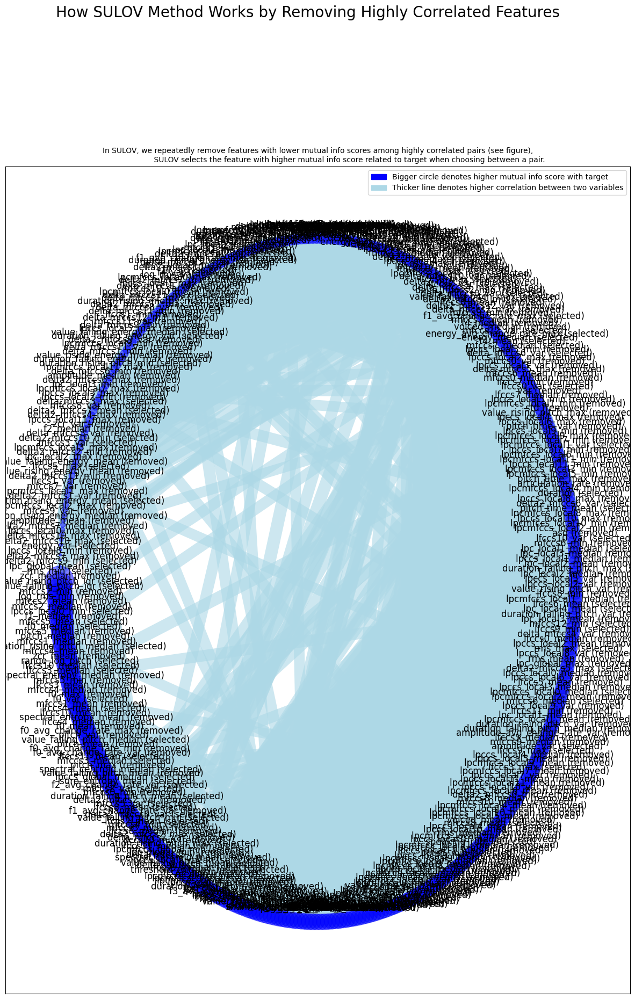

Time taken for SULOV method = 16 seconds
    Adding 0 categorical variables to reduced numeric variables  of 300
Finally 300 vars selected after SULOV
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
    Taking top 119 features per iteration...
    XGBoost version using 1.7.5 as tree method: hist
    Number of booster rounds = 100
            Time taken for regular XGBoost feature selection = 3 seconds
            Time taken for regular XGBoost feature selection = 3 seconds
            Time taken for regular XGBoost feature selection = 2 seconds
            Time taken for regular XGBoost feature selection = 1 seconds
            Time taken for regular XGBoost feature selection = 1 secon

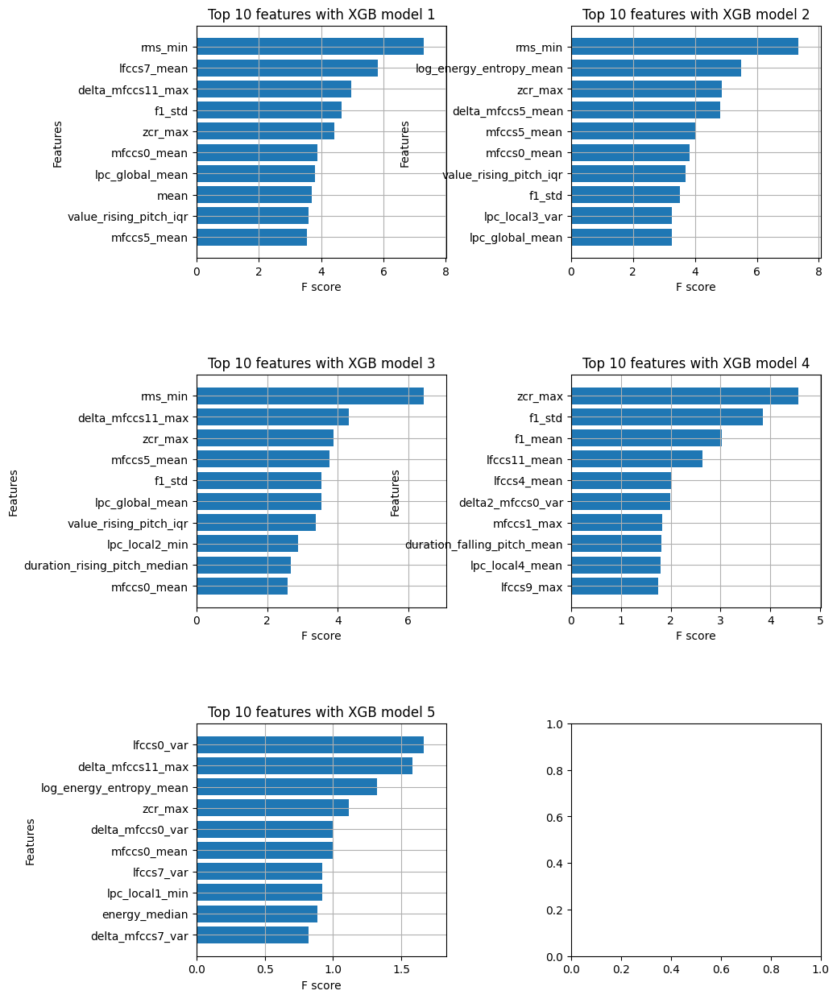

    Completed XGBoost feature selection in 3 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 215 important features. Too many to print...
Total Time taken for featurewiz selection = 28 seconds
Output contains a list of 215 important features and a train dataframe
    Time taken to create entire pipeline = 31 second(s)


In [72]:
# with different split size 

# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_all_stats, verbose=False, test_size=0.3)

# automatic feature selection using featurewiz package
fwiz = FeatureWiz(corr_limit=0.7, feature_engg='', category_encoders='', dask_xgboost_flag=False, nrows=None, verbose=2)

X_train = fwiz.fit_transform(X_train, y_train)
X_test = fwiz.transform(X_test)

# get list of selected features
selected_features = fwiz.features  


Evaluation: f1_score
99.55% for the train data
81.34% for the test data

Evaluation: accuracy_score
99.47% for the train data
81.99% for the test data

Evaluation: precision_score
99.69% for the train data
84.72% for the test data

Evaluation: recall_score
99.43% for the train data
79.86% for the test data

Evaluation: confusion_matrix of test predictions


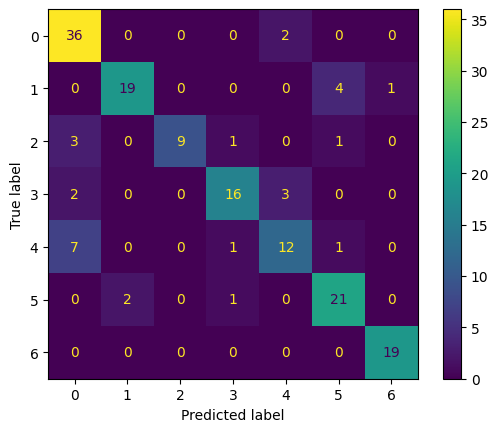


Hard cases for the model:

Label: disgust(2)
Hard cases of false negatives: ['anger(0)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']



In [73]:
# train the model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# evaluate the model
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

In [74]:
most_imp_features = selected_features

In [75]:
# save most important features
with open('../results/most_important_features_70_30_split_215.pkl', 'wb') as f:
    pickle.dump(most_imp_features, f)

In [76]:
# save model
pickle.dump(svm_model, open('../results/models/SVC_f1_macro_best_model_most_important215.pkl', 'wb'))

# Paper 2
### Liu et al. (2018) "Speech emotion recognition based on feature selection and extreme learning machine decision tree"

In [77]:
# read saved dataframe
df = pd.read_pickle('../results/df_prep_numerical_only_all_stats.pkl')

# feature selection
df_paper2 = df[['f0_max', 'f0_var', 'amplitude_max', 'energy_mean', 'amplitude_mean', 'zcr_mean', 'speaking_rate', 
                'spectral_centroid_mean', 'spectral_centroid_mean', 'f1_max', 'f1_mean', 'f1_std', 'f2_max', 'f2_mean', 
                'f2_std', 'f3_max', 'f3_std', 'f3_mean', 'f0_avg_change_rate_mean', 'energy_avg_change_rate_mean', 
                'amplitude_avg_change_rate_mean', 'f1_avg_change_rate_mean', 'f2_avg_change_rate_mean', 
                'f3_avg_change_rate_mean', 'label']]
df_paper2 = pd.concat([df_paper2, df.filter(regex='^(delta|mfccs|lfccs)\w+_mean$')], axis=1)
print(f'The dataframe has {len(df_paper2.columns)} columns.')
df_paper2.columns

The dataframe has 76 columns.


Index(['f0_max', 'f0_var', 'amplitude_max', 'energy_mean', 'amplitude_mean',
       'zcr_mean', 'speaking_rate', 'spectral_centroid_mean',
       'spectral_centroid_mean', 'f1_max', 'f1_mean', 'f1_std', 'f2_max',
       'f2_mean', 'f2_std', 'f3_max', 'f3_std', 'f3_mean',
       'f0_avg_change_rate_mean', 'energy_avg_change_rate_mean',
       'amplitude_avg_change_rate_mean', 'f1_avg_change_rate_mean',
       'f2_avg_change_rate_mean', 'f3_avg_change_rate_mean', 'label',
       'mfccs0_mean', 'mfccs1_mean', 'mfccs2_mean', 'mfccs3_mean',
       'mfccs4_mean', 'mfccs5_mean', 'mfccs6_mean', 'mfccs7_mean',
       'mfccs8_mean', 'mfccs9_mean', 'mfccs10_mean', 'mfccs11_mean',
       'mfccs12_mean', 'delta_mfccs0_mean', 'delta_mfccs1_mean',
       'delta_mfccs2_mean', 'delta_mfccs3_mean', 'delta_mfccs4_mean',
       'delta_mfccs5_mean', 'delta_mfccs6_mean', 'delta_mfccs7_mean',
       'delta_mfccs8_mean', 'delta_mfccs9_mean', 'delta_mfccs10_mean',
       'delta_mfccs11_mean', 'delta_mfccs12_me

In [78]:
# create train/test split
X_train, X_test, y_train, y_test = load_train_test_data(df_paper2, test_size=0.3)

A snippet of the data:


,f0_max,f0_var,amplitude_max,energy_mean,amplitude_mean,zcr_mean,speaking_rate,spectral_centroid_mean,spectral_centroid_mean,f1_max,f1_mean,f1_std,f2_max,f2_mean,f2_std,f3_max,f3_std,f3_mean,f0_avg_change_rate_mean,energy_avg_change_rate_mean,amplitude_avg_change_rate_mean,f1_avg_change_rate_mean,f2_avg_change_rate_mean,f3_avg_change_rate_mean,mfccs0_mean,mfccs1_mean,mfccs2_mean,mfccs3_mean,mfccs4_mean,mfccs5_mean,mfccs6_mean,mfccs7_mean,mfccs8_mean,mfccs9_mean,mfccs10_mean,mfccs11_mean,mfccs12_mean,delta_mfccs0_mean,delta_mfccs1_mean,delta_mfccs2_mean,delta_mfccs3_mean,delta_mfccs4_mean,delta_mfccs5_mean,delta_mfccs6_mean,delta_mfccs7_mean,delta_mfccs8_mean,delta_mfccs9_mean,delta_mfccs10_mean,delta_mfccs11_mean,delta_mfccs12_mean,delta2_mfccs0_mean,delta2_mfccs1_mean,delta2_mfccs2_mean,delta2_mfccs3_mean,delta2_mfccs4_mean,delta2_mfccs5_mean,delta2_mfccs6_mean,delta2_mfccs7_mean,delta2_mfccs8_mean,delta2_mfccs9_mean,delta2_mfccs10_mean,delta2_mfccs11_mean,delta2_mfccs12_mean,lfccs0_mean,lfccs1_mean,lfccs2_mean,lfccs3_mean,lfccs4_mean,lfccs5_mean,lfccs6_mean,lfccs7_mean,lfccs8_mean,lfccs9_mean,lfccs10_mean,lfccs11_mean
383,1.525845,1.206094,0.760068,0.317074,0.909308,1.338426,0.456822,0.540177,0.540177,0.743107,-0.067897,-0.545301,-0.545910,0.809108,0.574327,0.149094,-0.342760,-0.089789,-0.407227,0.062360,0.929839,-0.143098,0.016219,-0.471033,0.435260,-0.997914,-0.237505,-0.328507,-0.964237,-0.916971,-0.436511,0.485352,-1.466484,-1.676938,-0.623160,-1.545878,0.131605,0.918316,0.581176,-0.636879,-0.511475,-0.487945,-0.140095,0.067913,0.143268,-0.492649,0.283545,-1.486673,0.033260,0.945551,1.103540,-1.694898,-0.887902,0.367715,-1.319240,-0.266879,-0.330664,0.366629,-0.167171,-0.967311,0.722167,1.282151,-0.898049,0.791651,-0.906900,-0.837526,-0.443766,-0.097478,-0.872068,0.682026,0.043037,-0.279696,-0.972006,-1.743858,-0.245983
180,-1.575226,-1.206448,-1.321738,1.235771,-0.586936,-1.931865,0.209623,-0.313100,-0.313100,0.414712,1.008529,2.448280,1.999949,-0.399238,2.709614,1.163925,1.846434,1.551447,-0.407227,0.080439,0.897814,-0.632886,0.041527,-0.315931,0.253539,1.680797,1.128980,-0.061849,1.428238,3.023523,2.774592,-0.100087,0.986410,0.898155,0.887842,0.445738,1.033796,0.215660,-0.028897,0.224939,0.732799,-0.304120,-0.812887,0.069136,0.217385,0.178223,-0.535975,-0.482405,0.202800,-0.120524,1.173464,0.555142,-0.256760,0.588258,-0.226420,-1.059436,-0.495234,-0.132786,-0.550215,-0.733214,-0.872256,-0.322407,0.267054,-0.361862,0.530331,1.496105,0.999877,1.451860,0.761814,-0.691929,-0.583639,0.495418,0.111098,1.085186,2.457121
447,-1.119185,-0.900378,-2.032401,0.816171,0.630640,0.968309,1.624222,1.322148,1.322148,2.565445,1.538140,3.206076,0.705357,1.158634,2.332831,0.899687,2.627936,1.880887,-0.407227,2.554648,-0.697488,-0.539282,-1.081982,-0.372406,3.016815,-0.321927,1.210915,-0.279866,0.799196,2.039154,1.455036,1.522504,0.776596,0.919846,-0.031569,-0.158161,-0.542489,0.831870,-0.508707,0.799558,-0.592613,-1.645572,-0.361632,-0.717345,-1.977946,-0.992548,0.335843,1.205088,1.345985,0.998242,0.441185,1.287843,-0.517041,-0.231525,-1.044098,-1.240137,-0.881396,-0.566533,-0.589650,0.211228,-0.627407,-1.292787,0.686653,3.159583,-1.583903,0.015513,1.273022,0.182458,0.625249,-0.752866,0.068314,0.522608,0.447433,0.594748,0.468281
409,-0.675941,-0.541462,0.760068,0.392074,-0.031257,0.659251,-0.056061,0.435324,0.435324,-0.847374,0.358956,-0.792253,-0.873410,-1.040183,-1.443880,-0.886911,-1.180775,-0.626171,-0.407227,0.061329,-1.197594,-0.543484,-1.201806,-0.692179,-0.263610,-0.346001,-1.416076,-0.967379,-0.623749,-0.085471,-0.440442,-0.969464,0.178537,0.392534,0.864496,-0.489883,-0.632987,-1.461906,-1.001108,-1.214918,-2.449306,0.401876,0.944171,0.986778,-0.562346,2.536392,3.197237,-0.082637,0.287874,-0.569824,-1.810128,0.973143,2.856536,-0.605752,0.895440,0.375045,4.339030,3.864099,-3.076622,1.347338,-1.445572,-1.416653,-1.053647,-0.342277,0.468572,-0.555313,-0.837950,-0.871011,-0.288034,-2.548539,-0.675005,0.293606,-1.544340,-0.622789,-0.

There are 374 entries with 75 columns in the training data.
There are 161 entries with 75 columns in the testing data.


## ELM Decision Tree
Extreme Learning Machines are supposedly really good for generalization and fast training with one hidden layer only and many hidden units. From "High Performance Extreme Learning Machines: A Complete Toolbox for Big Data Applications" in IEEE Access. http://ieeexplore.ieee.org/xpl/articleDetails.jsp?arnumber=7140733&newsearch=true&queryText=High%20Performance%20Extreme%20Learning%20Machines
<br> Using scikit-elm: https://scikit-elm.readthedocs.io/en/latest/generated/skelm.ELMClassifier.html#skelm.ELMClassifier


Evaluation: f1_score
94.45% for the train data
63.93% for the test data

Evaluation: accuracy_score
94.39% for the train data
64.60% for the test data

Evaluation: precision_score
95.03% for the train data
65.31% for the test data

Evaluation: recall_score
94.15% for the train data
63.67% for the test data

Evaluation: confusion_matrix of test predictions


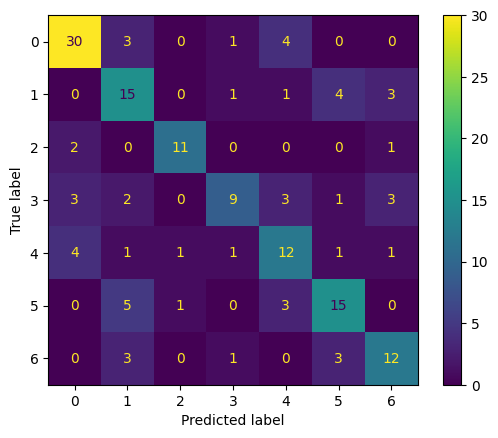


Hard cases for the model:

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)']



In [79]:
# with scikit-elm
elm = skelm.ELMClassifier(random_state=0)
elm.fit(X_train, y_train)
model_eval(elm, X_train, X_test, y_train, y_test, confusion=True)


Evaluation: f1_score
95.04% for the train data
64.88% for the test data

Evaluation: accuracy_score
95.19% for the train data
65.84% for the test data

Evaluation: precision_score
95.25% for the train data
66.29% for the test data

Evaluation: recall_score
94.94% for the train data
64.12% for the test data

Evaluation: confusion_matrix of test predictions


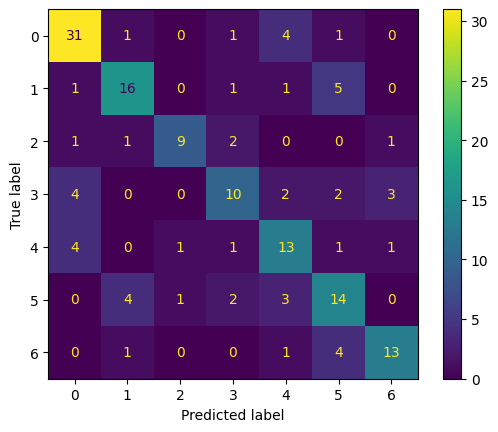


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']

Label: sadness(6)
Hard cases of false negatives: ['neutral(5)']



In [80]:
elm = skelm.ELMClassifier(ufunc='sigm', random_state=0)
elm.fit(X_train, y_train)
model_eval(elm, X_train, X_test, y_train, y_test, confusion=True)


Evaluation: f1_score
97.41% for the train data
71.51% for the test data

Evaluation: accuracy_score
97.59% for the train data
72.67% for the test data

Evaluation: precision_score
97.77% for the train data
73.68% for the test data

Evaluation: recall_score
97.11% for the train data
70.72% for the test data

Evaluation: confusion_matrix of test predictions


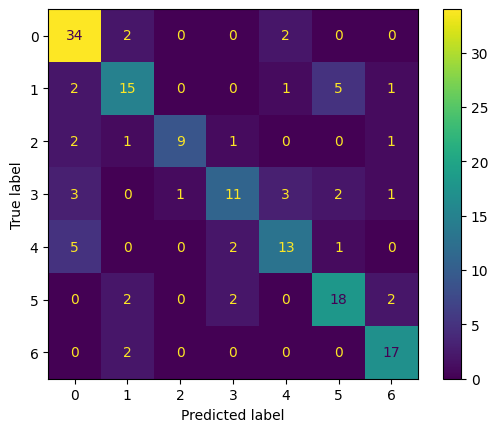


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']



In [81]:
elm = skelm.ELMClassifier(pairwise_metric='euclidean', random_state=0)
elm.fit(X_train, y_train)
model_eval(elm, X_train, X_test, y_train, y_test, confusion=True)


Evaluation: f1_score
91.73% for the train data
80.27% for the test data

Evaluation: accuracy_score
91.98% for the train data
80.75% for the test data

Evaluation: precision_score
93.16% for the train data
82.24% for the test data

Evaluation: recall_score
90.85% for the train data
79.10% for the test data

Evaluation: confusion_matrix of test predictions


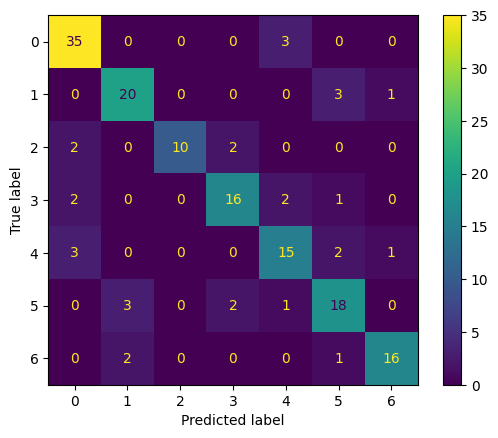


Hard cases for the model:



In [82]:
elm = skelm.ELMClassifier(pairwise_metric='cosine', random_state=0) # also achieved from n_neurons=74 (n_samples / 5 
                                                                    # which is often chosen as default) onwards
elm.fit(X_train, y_train)
model_eval(elm, X_train, X_test, y_train, y_test, confusion=True)

In [83]:
# save best model
pickle.dump(elm, open('../results/models/ELM_best_model.pkl', 'wb'))

Gridsearch is unfortunately not working with pairwise operator for skelm. Comparing different numbers of neurons in the hidden layers ("n_neurons"), shows very different results. Too few or too many neurons lead either to bad predicting or immense overfitting. Overall, leaving "n_neurons" per default brings better results here. "n_neurons=125" gives almost same results (125=n_samples/3).  


Evaluation: f1_score
94.72% for the train data
70.10% for the test data

Evaluation: accuracy_score
94.65% for the train data
71.43% for the test data

Evaluation: precision_score
95.77% for the train data
73.68% for the test data

Evaluation: recall_score
93.99% for the train data
68.64% for the test data

Evaluation: confusion_matrix of test predictions


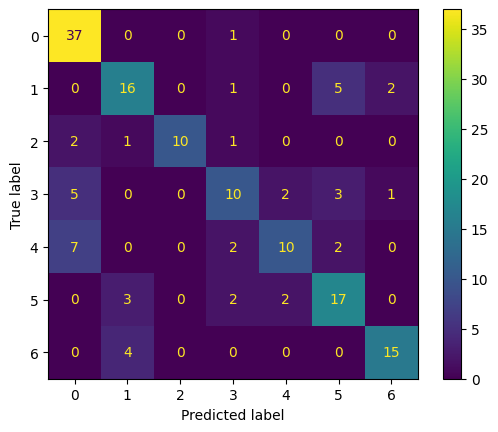


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']

Label: fear(3)
Hard cases of false negatives: ['anger(0)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']

Label: sadness(6)
Hard cases of false negatives: ['boredom(1)']



In [84]:
# compare with SVM
svm_model = SVC()
svm_model.fit(X_train, y_train)
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

### After Feature Selection

wiz = FeatureWiz(verbose=1)
        X_train_selected = wiz.fit_transform(X_train, y_train)
        X_test_selected = wiz.transform(X_test)
        wiz.features  ### provides a list of selected features ###            
        
############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
featurewiz has selected 0.7 as the correlation limit. Change this limit to fit your needs...
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Multi_Classification problem ####
You have duplicate column names in your data set. Removing duplicate columns now...
    Loaded train data. Shape = (374,

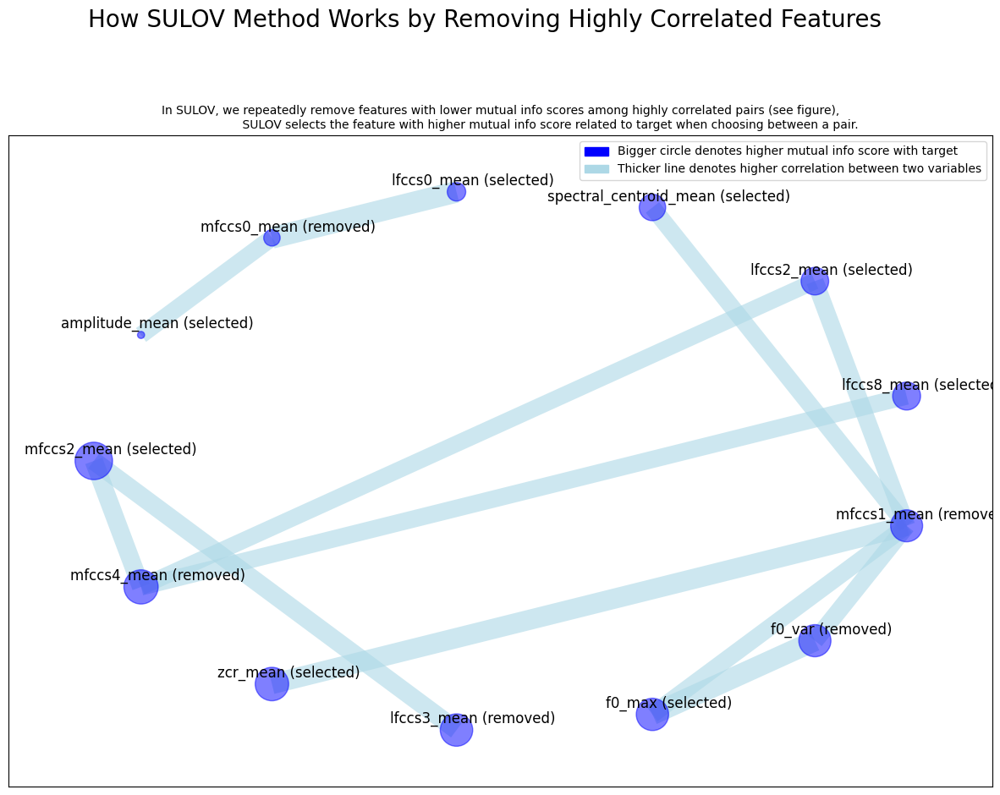

Time taken for SULOV method = 1 seconds
    Adding 0 categorical variables to reduced numeric variables  of 69
Finally 69 vars selected after SULOV
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
    Taking top 14 features per iteration...
    XGBoost version using 1.7.5 as tree method: hist
    Number of booster rounds = 100
        Selected: ['mfccs2_mean', 'mfccs5_mean', 'speaking_rate', 'lfccs2_mean', 'zcr_mean', 'lfccs0_mean', 'lfccs1_mean', 'f1_std', 'mfccs6_mean', 'f3_std', 'f0_max', 'delta_mfccs0_mean', 'mfccs3_mean', 'amplitude_avg_change_rate_mean']
            Time taken for regular XGBoost feature selection = 1 seconds
        Selected: ['mfccs2_mean', 'mfccs5_mean', 'lfccs

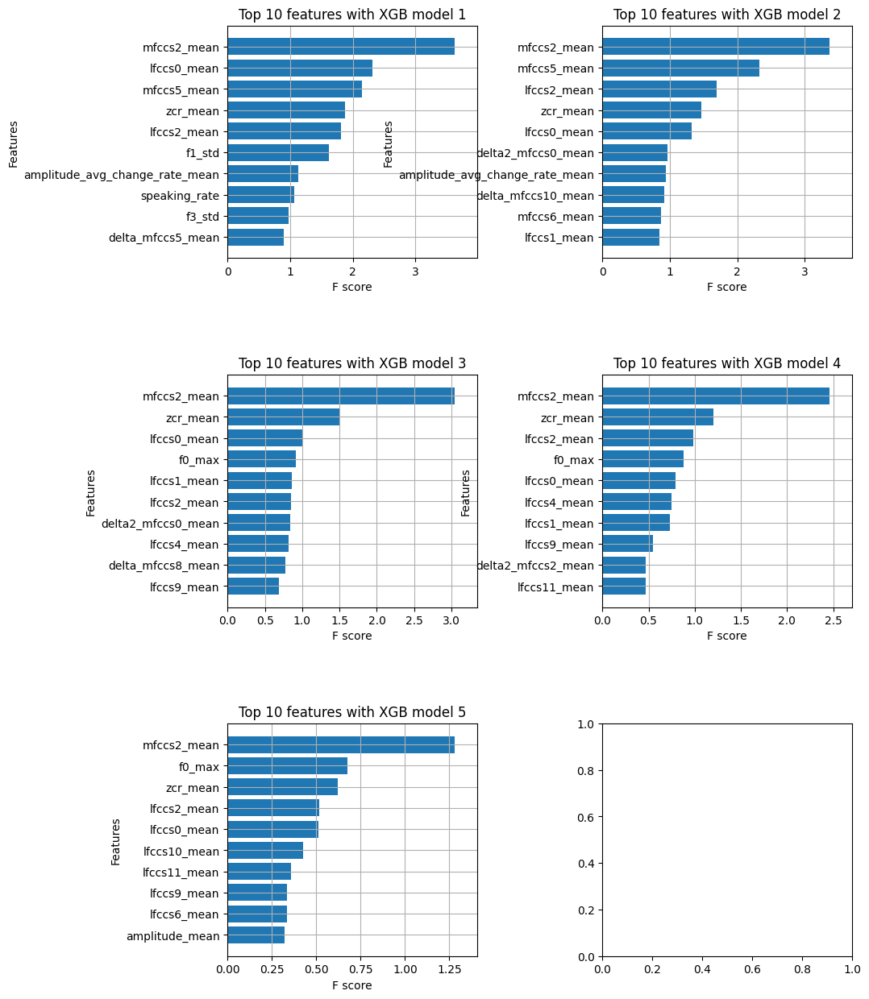

    Completed XGBoost feature selection in 3 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 32 important features. Too many to print...
Total Time taken for featurewiz selection = 9 seconds
Output contains a list of 32 important features and a train dataframe
    Time taken to create entire pipeline = 9 second(s)


In [85]:
# automatic feature selection using featurewiz package
fwiz = FeatureWiz(corr_limit=0.7, feature_engg='', category_encoders='', dask_xgboost_flag=False, nrows=None, verbose=2)

X_train = fwiz.fit_transform(X_train, y_train)
X_test = fwiz.transform(X_test)

# get list of selected features
selected_features = fwiz.features 


Evaluation: f1_score
94.94% for the train data
71.00% for the test data

Evaluation: accuracy_score
94.92% for the train data
72.67% for the test data

Evaluation: precision_score
95.31% for the train data
73.31% for the test data

Evaluation: recall_score
94.64% for the train data
70.12% for the test data

Evaluation: confusion_matrix of test predictions


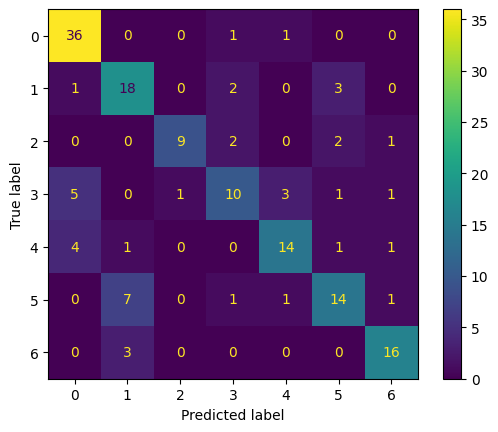


Hard cases for the model:

Label: boredom(1)
Hard cases of false positives: ['neutral(5)']

Label: fear(3)
Hard cases of false negatives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)']



In [86]:
# run best model settings with these features again
elm = skelm.ELMClassifier(pairwise_metric='euclidean', random_state=0)
elm.fit(X_train, y_train)
model_eval(elm, X_train, X_test, y_train, y_test, confusion=True)


Evaluation: f1_score
91.97% for the train data
62.88% for the test data

Evaluation: accuracy_score
91.98% for the train data
65.22% for the test data

Evaluation: precision_score
93.27% for the train data
66.61% for the test data

Evaluation: recall_score
91.16% for the train data
61.51% for the test data

Evaluation: confusion_matrix of test predictions


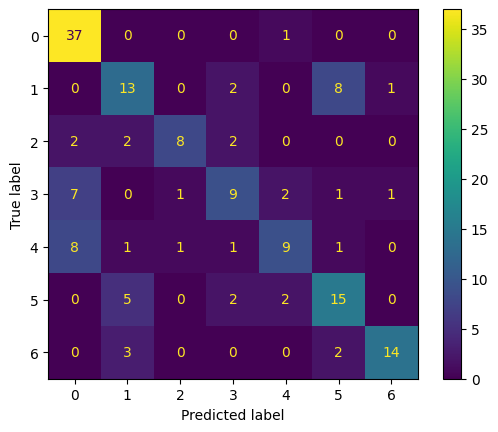


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']
Hard cases of false positives: ['neutral(5)']

Label: fear(3)
Hard cases of false negatives: ['anger(0)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)']
Hard cases of false positives: ['boredom(1)']



In [87]:
# compare with SVM
svm_model = SVC()
svm_model.fit(X_train, y_train)
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

Actually worse after feature selection. Featurewiz probably selected too few features. Let's also try out the ELM model with the most important features selected by featurewiz on the whole data set. 

In [88]:
# load most important 215 features from featurewiz selection on 70-30 split
with open('../results/most_important_features_70_30_split_215.pkl', 'rb') as f:
    most_imp_features = pickle.load(f)
    
df_most_important215 = df_all_stats[most_imp_features]
df_most_important215['label'] = df_all_stats['label']

# load train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_most_important215, verbose=False, test_size=0.3)


Evaluation: f1_score
97.05% for the train data
69.10% for the test data

Evaluation: accuracy_score
96.79% for the train data
70.81% for the test data

Evaluation: precision_score
97.77% for the train data
71.42% for the test data

Evaluation: recall_score
96.55% for the train data
68.86% for the test data

Evaluation: confusion_matrix of test predictions


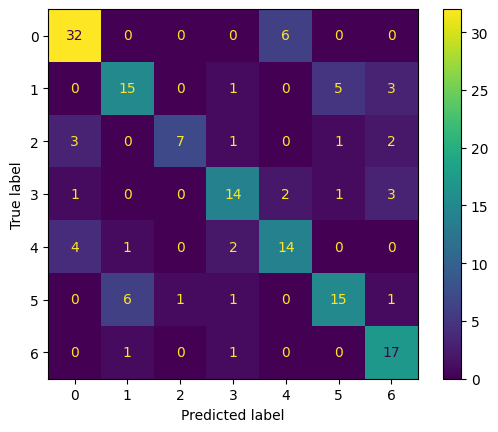


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']
Hard cases of false positives: ['neutral(5)']

Label: disgust(2)
Hard cases of false negatives: ['anger(0)']

Label: happiness(4)
Hard cases of false positives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)']
Hard cases of false positives: ['boredom(1)']



In [89]:
# run best model settings with these features again
elm = skelm.ELMClassifier(pairwise_metric='cosine', random_state=0)
elm.fit(X_train, y_train)
model_eval(elm, X_train, X_test, y_train, y_test, confusion=True)

And with all possibile statistics:


Evaluation: f1_score
97.89% for the train data
69.77% for the test data

Evaluation: accuracy_score
97.86% for the train data
70.81% for the test data

Evaluation: precision_score
97.89% for the train data
70.82% for the test data

Evaluation: recall_score
97.97% for the train data
69.70% for the test data

Evaluation: confusion_matrix of test predictions


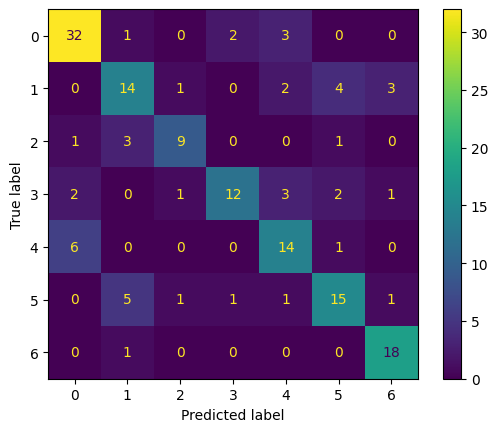


Hard cases for the model:

Label: boredom(1)
Hard cases of false positives: ['neutral(5)']

Label: disgust(2)
Hard cases of false negatives: ['boredom(1)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)']



In [91]:
# load the data
df_all_stats = pd.read_pickle('../results/df_prep_numerical_only_all_stats.pkl')

# load train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_all_stats, verbose=False, test_size=0.3)

# train and evaluate model
elm = skelm.ELMClassifier(ufunc='sigm', random_state=0)
elm.fit(X_train, y_train)
model_eval(elm, X_train, X_test, y_train, y_test, confusion=True)

With PCA:

In [92]:
# load pca 
pca = pickle.load(open('../results/pca.pkl','rb'))


Evaluation: f1_score
96.21% for the train data
81.40% for the test data

Evaluation: accuracy_score
96.26% for the train data
80.75% for the test data

Evaluation: precision_score
97.15% for the train data
82.66% for the test data

Evaluation: recall_score
95.61% for the train data
80.82% for the test data

Evaluation: confusion_matrix of test predictions


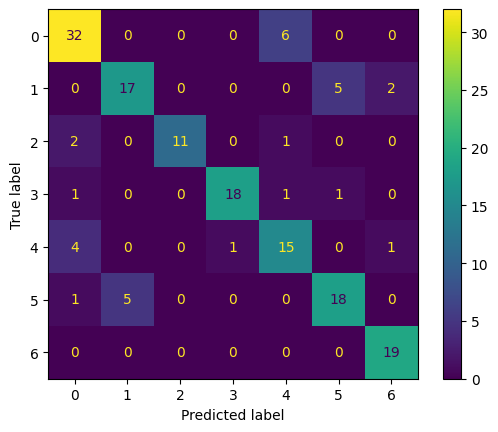


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']
Hard cases of false positives: ['neutral(5)']

Label: happiness(4)
Hard cases of false positives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)']
Hard cases of false positives: ['boredom(1)']



In [93]:
# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_all_stats, verbose=False, test_size=0.3)

# apply pca
X_train = pca.transform(X_train)
X_test = pca.transform(X_test)

# train and evaluate model
elm = skelm.ELMClassifier(pairwise_metric='cosine', random_state=0)
elm.fit(X_train, y_train)
model_eval(elm, X_train, X_test, y_train, y_test, confusion=True)

## SVM with all stats


Evaluation: f1_score
99.32% for the train data
79.26% for the test data

Evaluation: accuracy_score
99.20% for the train data
79.50% for the test data

Evaluation: precision_score
99.53% for the train data
82.11% for the test data

Evaluation: recall_score
99.13% for the train data
77.75% for the test data

Evaluation: confusion_matrix of test predictions


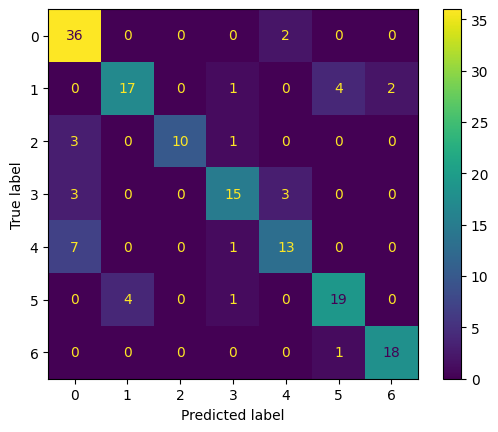


Hard cases for the model:

Label: disgust(2)
Hard cases of false negatives: ['anger(0)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']



In [94]:
# load the data
df_all_stats = pd.read_pickle('../results/df_prep_numerical_only_all_stats.pkl')

# load train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_all_stats, verbose=False, test_size=0.3)

# train and evaluate svm model
svm_model = SVC()
svm_model.fit(X_train, y_train)
model_eval(svm_model, X_train, X_test, y_train, y_test, confusion=True)

## Feature Importance

RBF kernel. Computing permutation importance.


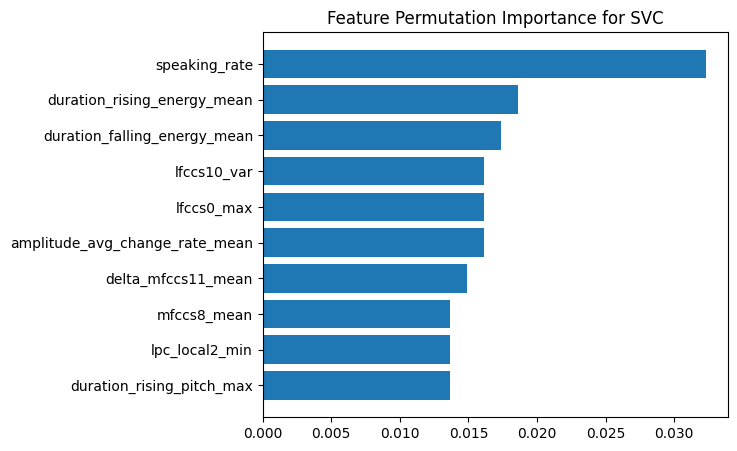

In [95]:
# feature importance of the best svm model (featurewiz 215)

# load most important 215 features from featurewiz selection on 70-30 split
with open('../results/most_important_features_70_30_split_215.pkl', 'rb') as f:
    most_imp_features = pickle.load(f)
    
df_most_important215 = df_all_stats[most_imp_features]
df_most_important215['label'] = df_all_stats['label']

svm_best_model = load_model('SVC', 'f1_macro', name_spec='most_important215')

X_train, X_test, y_train, y_test = load_train_test_data(df_most_important215, verbose=False, test_size=0.3)
feature_imp_svm = feature_importance(svm_best_model, X_test, y_test, top=10)

In [96]:
feature_imp_svm

('speaking_rate',
 'duration_rising_energy_mean',
 'duration_falling_energy_mean',
 'lfccs10_var',
 'lfccs0_max',
 'amplitude_avg_change_rate_mean',
 'delta_mfccs11_mean',
 'mfccs8_mean',
 'lpc_local2_min',
 'duration_rising_pitch_max')

# Other Models
Besides the features and models from the papers, we also want to investigate other models and find an overall best combination of features and model with highest performance measured in F1 macro.

In [107]:
# load train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_most_important215, verbose=False, test_size=0.3)

## Decision Tree


Evaluation: f1_score
100.00% for the train data
54.78% for the test data

Evaluation: accuracy_score
100.00% for the train data
57.14% for the test data

Evaluation: precision_score
100.00% for the train data
54.97% for the test data

Evaluation: recall_score
100.00% for the train data
55.65% for the test data

Evaluation: confusion_matrix of test predictions


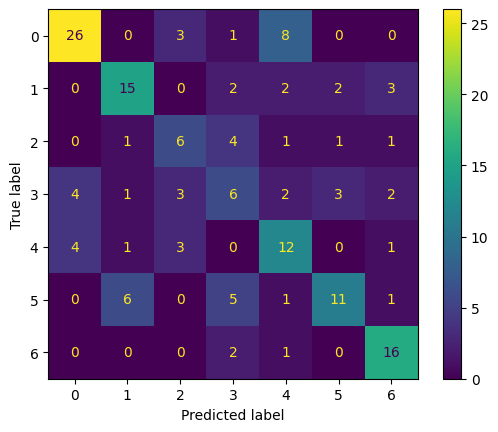


Hard cases for the model:

Label: anger(0)
Hard cases of false negatives: ['happiness(4)']

Label: boredom(1)
Hard cases of false positives: ['neutral(5)']

Label: disgust(2)
Hard cases of false negatives: ['fear(3)']

Label: fear(3)
Hard cases of false positives: ['neutral(5)']

Label: happiness(4)
Hard cases of false positives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)', 'fear(3)']



In [98]:
dtc = DecisionTreeClassifier(random_state=0)
dtc.fit(X_train, y_train)
model_eval(dtc, X_train, X_test, y_train, y_test, confusion=True)

 Number of leaves: 67
 Depth of the tree: 10
 General structure of the generated tree:



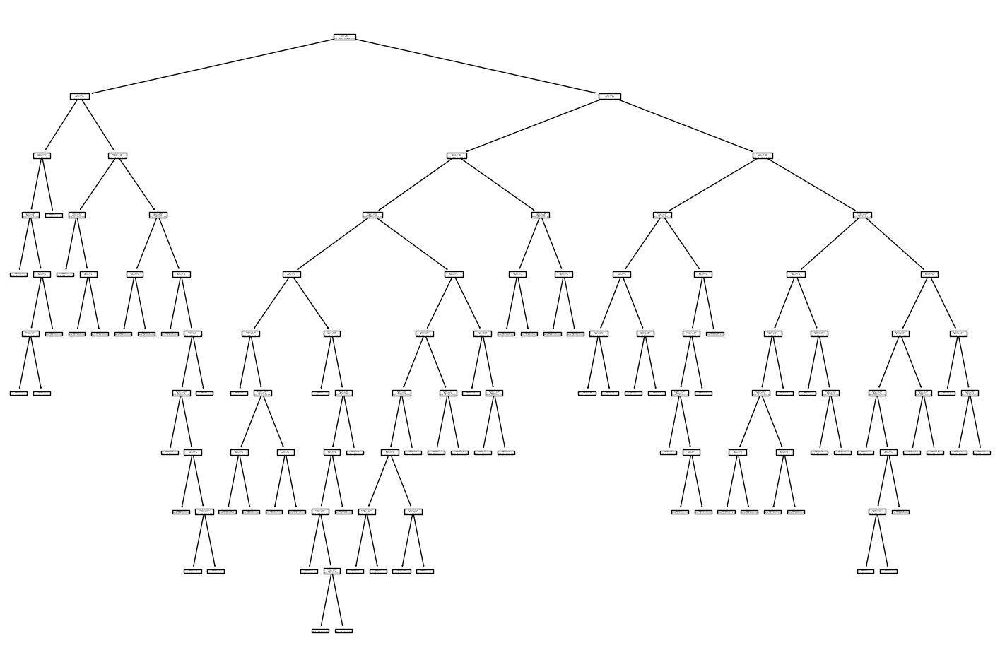

In [106]:
plt.figure(figsize=(18,12))
print(f' Number of leaves: {dtc.get_n_leaves()}\n Depth of the tree: {dtc.get_depth()}\n General structure of the generated tree:\n')
x = plot_tree(dtc)

As expected, the DecisionTreeClassifier is extremely overfitting. Let's see if a slight change of hyperparameters can improve this.

In [107]:
# define grid
decision_tree_grid = {'criterion' : ['gini', 'entropy'], 
                      'max_depth' : [5, 10, 20, 30]
                     }

In [108]:
run_gridsearchCV(dtc, decision_tree_grid, X_train, y_train, verbose=0)


Best hyperparameters : {'criterion': 'entropy', 'max_depth': 5}
Best cross-validated f1_macro : 0.4941371505845675



Evaluation: f1_score
83.00% for the train data
44.50% for the test data

Evaluation: accuracy_score
83.96% for the train data
49.07% for the test data

Evaluation: precision_score
84.59% for the train data
45.23% for the test data

Evaluation: recall_score
83.05% for the train data
45.70% for the test data

Evaluation: confusion_matrix of test predictions


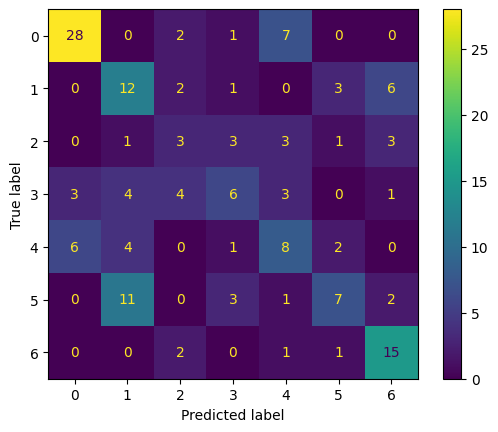


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['sadness(6)']
Hard cases of false positives: ['neutral(5)']

Label: disgust(2)
Hard cases of false negatives: ['fear(3)', 'happiness(4)', 'sadness(6)']
Hard cases of false positives: ['fear(3)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']
Hard cases of false positives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)']
Hard cases of false positives: ['boredom(1)']

Label: sadness(6)
Hard cases of false positives: ['boredom(1)']



In [109]:
# reload the best model & evaluate
dtc_best_model = load_model('DecisionTreeClassifier', 'f1_macro')
model_eval(dtc_best_model, X_train, X_test, y_train, y_test, confusion=True)

 Number of leaves: 29
 Depth of the tree: 5
 General structure of the generated tree:



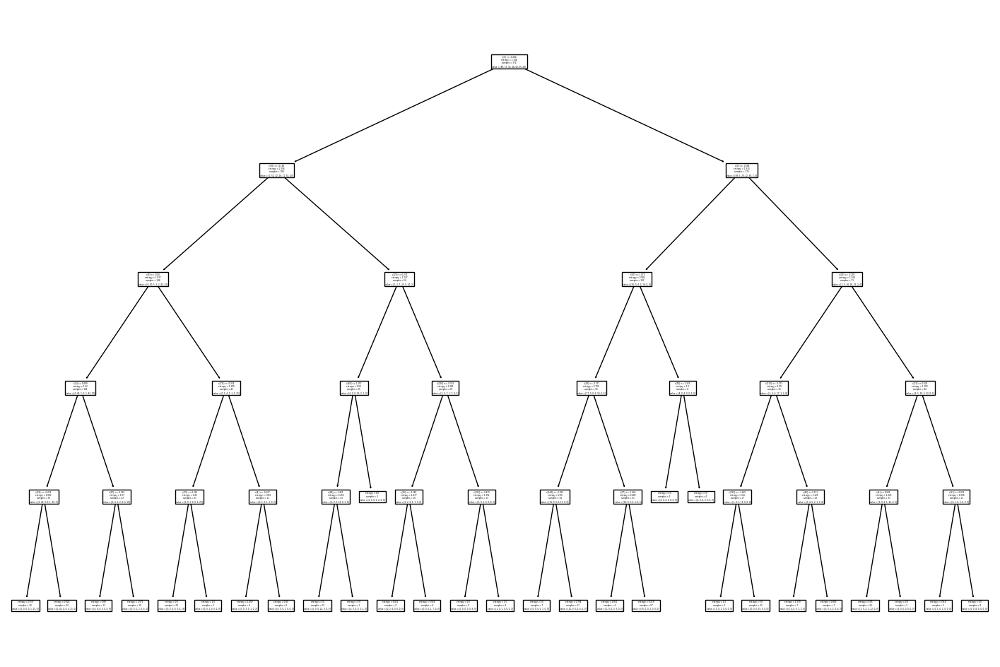

In [110]:
plt.figure(figsize=(18,12))
print(f' Number of leaves: {dtc_best_model.get_n_leaves()}\n Depth of the tree: {dtc_best_model.get_depth()}\n General structure of the generated tree:\n')
x = plot_tree(dtc_best_model)

Still bad generalization!

## Random Forest


Evaluation: f1_score
100.00% for the train data
71.32% for the test data

Evaluation: accuracy_score
100.00% for the train data
73.29% for the test data

Evaluation: precision_score
100.00% for the train data
76.72% for the test data

Evaluation: recall_score
100.00% for the train data
70.06% for the test data

Evaluation: confusion_matrix of test predictions


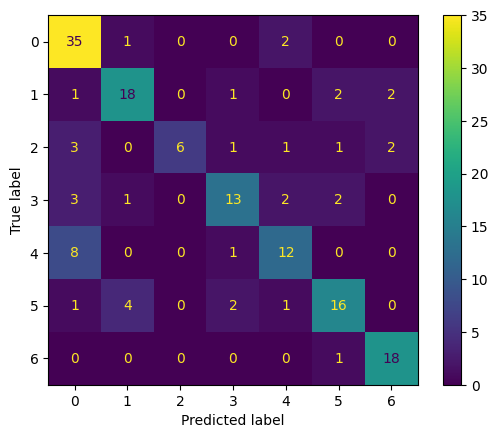


Hard cases for the model:

Label: disgust(2)
Hard cases of false negatives: ['anger(0)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']



In [99]:
rfc = RandomForestClassifier(random_state=0)
rfc.fit(X_train, y_train)
model_eval(rfc, X_train, X_test, y_train, y_test, confusion=True)

In [112]:
# define grid
random_forest_grid = {'n_estimators': [5, 10, 100, 200],
                      'max_depth' : [5, 10, 20, 30],
                      'bootstrap': [True, False],
                      'warm_start': [True, False]
                     }

In [113]:
run_gridsearchCV(rfc, random_forest_grid, X_train, y_train, verbose=0)


Best hyperparameters : {'bootstrap': False, 'max_depth': 20, 'n_estimators': 100, 'warm_start': True}
Best cross-validated f1_macro : 0.7633567843884133



Evaluation: f1_score
100.00% for the train data
78.49% for the test data

Evaluation: accuracy_score
100.00% for the train data
79.50% for the test data

Evaluation: precision_score
100.00% for the train data
81.75% for the test data

Evaluation: recall_score
100.00% for the train data
77.31% for the test data

Evaluation: confusion_matrix of test predictions


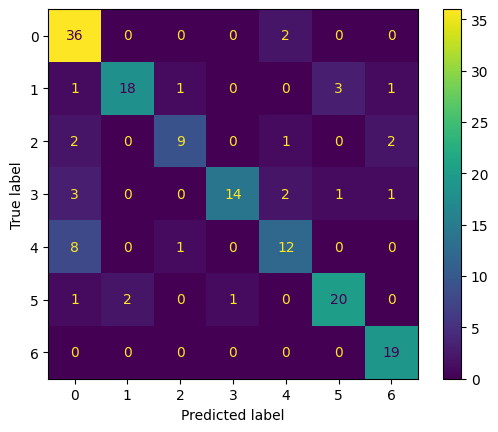


Hard cases for the model:

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']



In [114]:
# reload the best model & evaluate
rfc_best_model = load_model('RandomForestClassifier', 'f1_macro')
model_eval(rfc_best_model, X_train, X_test, y_train, y_test, confusion=True)

## KNN Classifier


Evaluation: f1_score
83.35% for the train data
71.64% for the test data

Evaluation: accuracy_score
83.42% for the train data
73.29% for the test data

Evaluation: precision_score
85.04% for the train data
74.43% for the test data

Evaluation: recall_score
82.60% for the train data
71.50% for the test data

Evaluation: confusion_matrix of test predictions


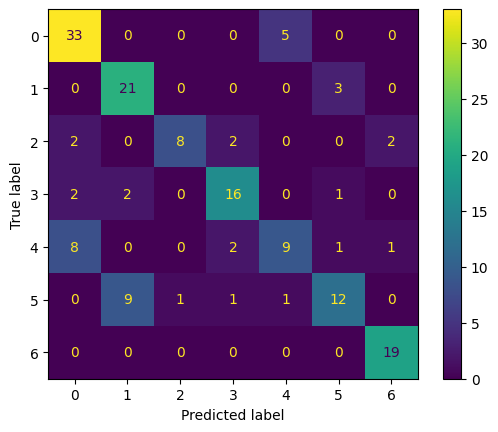


Hard cases for the model:

Label: boredom(1)
Hard cases of false positives: ['neutral(5)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']
Hard cases of false positives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)']



In [115]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
model_eval(knn, X_train, X_test, y_train, y_test, confusion=True)

In [116]:
# define grid
knn_grid = {'n_neighbors': [3, 4, 5, 6, 7, 8],
           'weights': ['uniform', 'distance'],
           }

In [117]:
run_gridsearchCV(knn, knn_grid, X_train, y_train, verbose=0)


Best hyperparameters : {'n_neighbors': 7, 'weights': 'distance'}
Best cross-validated f1_macro : 0.6922526982109507



Evaluation: f1_score
100.00% for the train data
69.23% for the test data

Evaluation: accuracy_score
100.00% for the train data
70.81% for the test data

Evaluation: precision_score
100.00% for the train data
71.30% for the test data

Evaluation: recall_score
100.00% for the train data
69.22% for the test data

Evaluation: confusion_matrix of test predictions


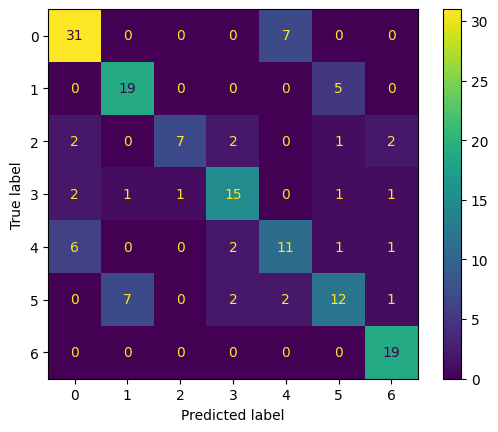


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']
Hard cases of false positives: ['neutral(5)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']
Hard cases of false positives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)']
Hard cases of false positives: ['boredom(1)']



In [118]:
# reload the best model & evaluate
knn_best_model = load_model('KNeighborsClassifier', 'f1_macro')
model_eval(knn_best_model, X_train, X_test, y_train, y_test, confusion=True)

## Naive Bayes

In [119]:
# first check if data follows a normal distribution
from scipy.stats import shapiro

looks_gaussian = []
doesntlook_gaussian = []

for feature in X_train.columns:
    stat, p = shapiro(X_train[feature])
    #print('Feature {}: Statistics = {}, p = {}'.format(feature, stat, p))
    alpha = 0.05
    if p > alpha:
        looks_gaussian.append(feature)
    else:
        doesntlook_gaussian.append(feature)

print('Feature that look Gaussian:\n{}\n'.format(looks_gaussian))
print('Feature that do not look Gaussian:\n{}'.format(doesntlook_gaussian))

Feature that look Gaussian:
['mfccs0_mean', 'zcr_max', 'lfccs3_median', 'speaking_rate', 'mfccs4_max', 'lfccs7_mean', 'mfccs9_mean', 'lfccs0_max', 'delta2_mfccs3_max', 'amplitude_avg_change_rate_min', 'delta_mfccs2_mean', 'lpc_local4_min', 'lfccs6_mean', 'lfccs6_max', 'mfccs9_max', 'lfccs11_mean', 'f2_mean', 'delta_mfccs11_median', 'f4_avg_change_rate_min', 'lfccs8_max', 'delta_mfccs0_max', 'lfccs8_mean', 'lfccs10_median', 'delta_mfccs3_min', 'lfccs3_max', 'mfccs3_median', 'threshold_entropy_mean', 'f3_avg_change_rate_min', 'mfccs8_mean', 'mfccs11_min', 'mfccs7_min']

Feature that do not look Gaussian:
['rms_min', 'lpc_global_mean', 'value_rising_pitch_iqr', 'mfccs5_mean', 'lpc_local4_mean', 'voiced_var', 'f1_std', 'duration_rising_pitch_max', 'lfccs4_var', 'spectral_entropy_min', 'skew_log_pitch', 'duration_rising_pitch_median', 'delta_mfccs0_min', 'shannon_entropy_mean', 'rms_max', 'lpcmfccs_local0_median', 'lfccs5_var', 'mfccs10_median', 'lpcmfccs_local10_median', 'range_log_pitch',


Evaluation: f1_score
88.23% for the train data
70.03% for the test data

Evaluation: accuracy_score
88.77% for the train data
72.05% for the test data

Evaluation: precision_score
88.32% for the train data
71.52% for the test data

Evaluation: recall_score
88.80% for the train data
69.75% for the test data

Evaluation: confusion_matrix of test predictions


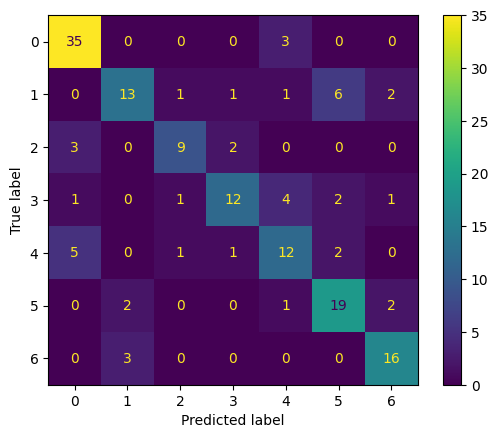


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']

Label: disgust(2)
Hard cases of false negatives: ['anger(0)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']

Label: neutral(5)
Hard cases of false positives: ['boredom(1)']



In [120]:
gnb = GaussianNB()
gnb.fit(X_train, y_train)
model_eval(gnb, X_train, X_test, y_train, y_test, confusion=True)


Evaluation: f1_score
83.27% for the train data
74.99% for the test data

Evaluation: accuracy_score
83.69% for the train data
75.16% for the test data

Evaluation: precision_score
83.35% for the train data
77.38% for the test data

Evaluation: recall_score
83.50% for the train data
74.46% for the test data

Evaluation: confusion_matrix of test predictions


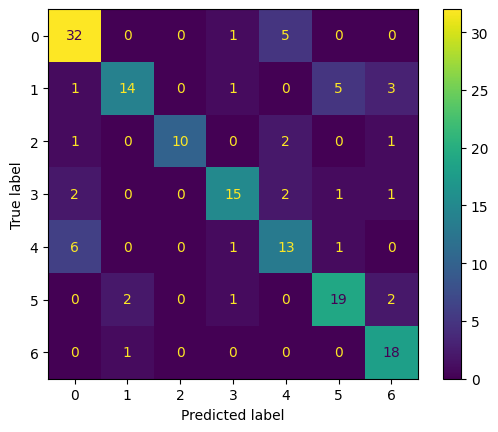


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']
Hard cases of false positives: ['anger(0)']



In [121]:
bnb = BernoulliNB()
bnb.fit(X_train, y_train)
model_eval(bnb, X_train, X_test, y_train, y_test, confusion=True)

## XGBoost Classifier


Evaluation: f1_score
100.00% for the train data
77.52% for the test data

Evaluation: accuracy_score
100.00% for the train data
77.64% for the test data

Evaluation: precision_score
100.00% for the train data
79.24% for the test data

Evaluation: recall_score
100.00% for the train data
76.79% for the test data

Evaluation: confusion_matrix of test predictions


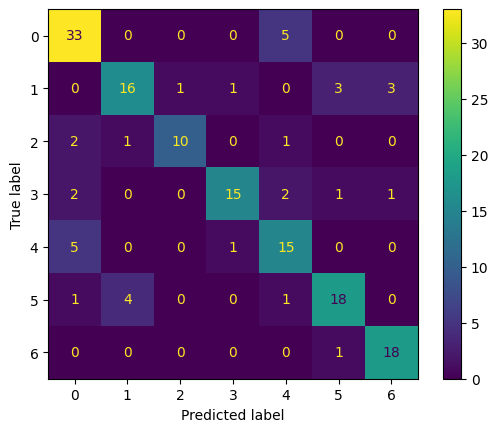


Hard cases for the model:

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']
Hard cases of false positives: ['anger(0)']



In [122]:
xgb = XGBClassifier(random_state=0)
xgb.fit(X_train, y_train)
model_eval(xgb, X_train, X_test, y_train, y_test, confusion=True)

In [123]:
# define grid
xgb_grid = {'n_estimators': [5, 10, 100, 200, 250, 300],
            'max_depth' : [2, 5, 10, 20, 30],
            'learning_rate': [0.001, 0.01, 0.5]
           }

In [124]:
run_gridsearchCV(xgb, xgb_grid, X_train, y_train, verbose=0)


Best hyperparameters : {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 300}
Best cross-validated f1_macro : 0.7835263975241571


In [112]:
# define grid
xgb_grid = {'n_estimators': [5, 10, 100, 200, 250, 300],
            'max_depth' : [2, 5, 10, 20, 30],
            'eta': [0.001, 0.01, 0.1, 0.5]
           }

In [113]:
run_gridsearchCV(xgb, xgb_grid, X_train, y_train, verbose=0)


Best hyperparameters : {'eta': 0.001, 'max_depth': 2, 'n_estimators': 100}
Best cross-validated f1_macro : 0.7670774022865807



Evaluation: f1_score
100.00% for the train data
80.41% for the test data

Evaluation: accuracy_score
100.00% for the train data
80.75% for the test data

Evaluation: precision_score
100.00% for the train data
82.64% for the test data

Evaluation: recall_score
100.00% for the train data
79.33% for the test data

Evaluation: confusion_matrix of test predictions


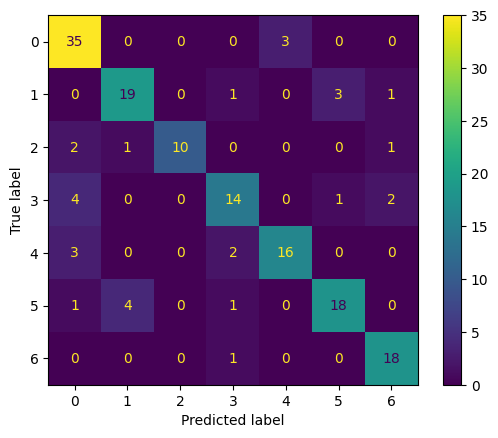


Hard cases for the model:



In [114]:
# reload the best model & evaluate
xgb_best_model = load_model('XGBClassifier', 'f1_macro')
model_eval(xgb_best_model, X_train, X_test, y_train, y_test, confusion=True)

From all of these traditional models, Random Forest and XGB Classifier show best performance. Hence, let's also run the models with all numerical features we created and also try out it's performance with PCA.
### a) With all numerical features

In [127]:
# load the data iwth all numerical features
df_all_stats = pd.read_pickle('../results/df_prep_numerical_only_all_stats.pkl')

# load train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_all_stats, verbose=False, test_size=0.3)

#### Random Forest 

In [128]:
run_gridsearchCV(rfc, random_forest_grid, X_train, y_train, verbose=0, name_spec='with_all_stats')


Best hyperparameters : {'bootstrap': False, 'max_depth': 10, 'n_estimators': 200, 'warm_start': True}
Best cross-validated f1_macro : 0.7387847399226148



Evaluation: f1_score
100.00% for the train data
77.66% for the test data

Evaluation: accuracy_score
100.00% for the train data
78.88% for the test data

Evaluation: precision_score
100.00% for the train data
80.03% for the test data

Evaluation: recall_score
100.00% for the train data
76.81% for the test data

Evaluation: confusion_matrix of test predictions


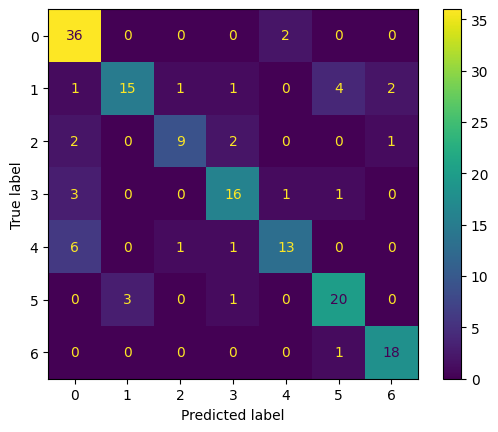


Hard cases for the model:

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']



In [130]:
# reload the best model & evaluate
rfc_best_model_all_stats = load_model('RandomForestClassifier', 'f1_macro', name_spec='with_all_stats')
model_eval(rfc_best_model_all_stats, X_train, X_test, y_train, y_test, confusion=True)

#### XGB Classifier

In [131]:
run_gridsearchCV(xgb, xgb_grid, X_train, y_train, verbose=0, name_spec='with_all_stats')


Best hyperparameters : {'learning_rate': 0.5, 'max_depth': 2, 'n_estimators': 100}
Best cross-validated f1_macro : 0.755863745042254



Evaluation: f1_score
100.00% for the train data
80.49% for the test data

Evaluation: accuracy_score
100.00% for the train data
80.75% for the test data

Evaluation: precision_score
100.00% for the train data
81.72% for the test data

Evaluation: recall_score
100.00% for the train data
79.89% for the test data

Evaluation: confusion_matrix of test predictions


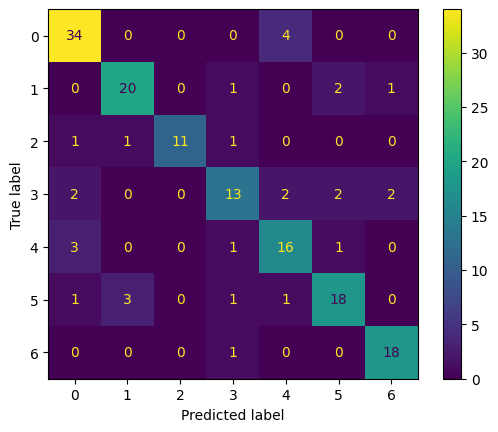


Hard cases for the model:



In [132]:
# reload the best model & evaluate
xgb_best_model_all_stats = load_model('XGBClassifier', 'f1_macro', name_spec='with_all_stats')
model_eval(xgb_best_model_all_stats, X_train, X_test, y_train, y_test, confusion=True)

### b) with PCA

In [133]:
# load pca 
pca = pickle.load(open('../results/pca.pkl','rb'))

# load the train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_all_stats, verbose=False, test_size=0.3)

# apply pca
X_train = pca.transform(X_train)
X_test = pca.transform(X_test)

#### Random Forest

In [134]:
run_gridsearchCV(rfc, random_forest_grid, X_train, y_train, verbose=0, name_spec='with_pca')


Best hyperparameters : {'bootstrap': False, 'max_depth': 20, 'n_estimators': 200, 'warm_start': True}
Best cross-validated f1_macro : 0.6246272478916862



Evaluation: f1_score
100.00% for the train data
67.47% for the test data

Evaluation: accuracy_score
100.00% for the train data
68.94% for the test data

Evaluation: precision_score
100.00% for the train data
75.03% for the test data

Evaluation: recall_score
100.00% for the train data
66.01% for the test data

Evaluation: confusion_matrix of test predictions


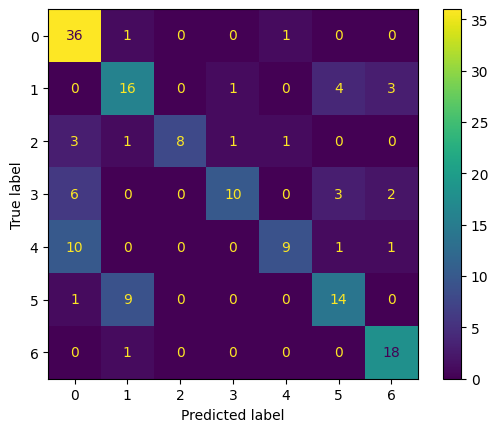


Hard cases for the model:

Label: boredom(1)
Hard cases of false positives: ['neutral(5)']

Label: disgust(2)
Hard cases of false negatives: ['anger(0)']

Label: fear(3)
Hard cases of false negatives: ['anger(0)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']

Label: neutral(5)
Hard cases of false negatives: ['boredom(1)']



In [135]:
# reload the best model & evaluate
rfc_best_model_pca = load_model('RandomForestClassifier', 'f1_macro', name_spec='with_pca')
model_eval(rfc_best_model_pca, X_train, X_test, y_train, y_test, confusion=True)

#### XGB Classifier

In [136]:
run_gridsearchCV(xgb, xgb_grid, X_train, y_train, verbose=0, name_spec='with_pca')


Best hyperparameters : {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 300}
Best cross-validated f1_macro : 0.6637294025331968



Evaluation: f1_score
100.00% for the train data
71.30% for the test data

Evaluation: accuracy_score
100.00% for the train data
72.67% for the test data

Evaluation: precision_score
100.00% for the train data
73.93% for the test data

Evaluation: recall_score
100.00% for the train data
69.94% for the test data

Evaluation: confusion_matrix of test predictions


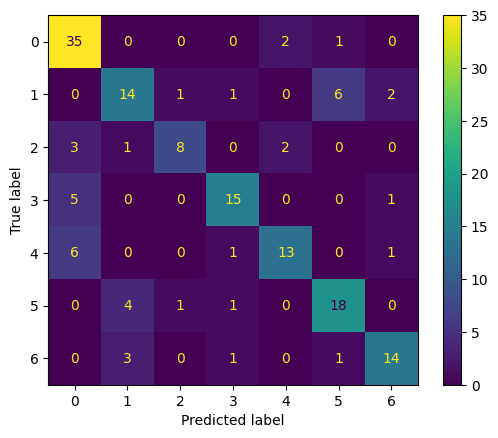


Hard cases for the model:

Label: boredom(1)
Hard cases of false negatives: ['neutral(5)']

Label: disgust(2)
Hard cases of false negatives: ['anger(0)']

Label: fear(3)
Hard cases of false negatives: ['anger(0)']

Label: happiness(4)
Hard cases of false negatives: ['anger(0)']

Label: neutral(5)
Hard cases of false positives: ['boredom(1)']



In [137]:
# reload the best model & evaluate
xgb_best_model_pca = load_model('XGBClassifier', 'f1_macro', name_spec='with_pca')
model_eval(xgb_best_model_pca, X_train, X_test, y_train, y_test, confusion=True)

## Feature Importance for best models

In [100]:
# feature importance of the best svm model (featurewiz 215)

# load most important 215 features from featurewiz selection on 70-30 split
with open('../results/most_important_features_70_30_split_215.pkl', 'rb') as f:
    most_imp_features = pickle.load(f)
    
df_most_important215 = df_all_stats[most_imp_features]
df_most_important215['label'] = df_all_stats['label']

X_train, X_test, y_train, y_test = load_train_test_data(df_most_important215, verbose=False, test_size=0.3)

RBF kernel. Computing permutation importance.


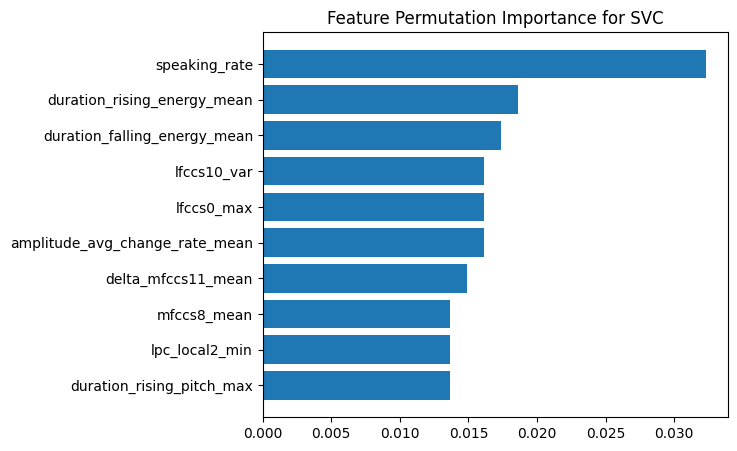

In [101]:
svm_best_model = load_model('SVC', 'f1_macro', name_spec='most_important215') # load model
feature_imp_svm = feature_importance(svm_best_model, X_test, y_test, top=10)

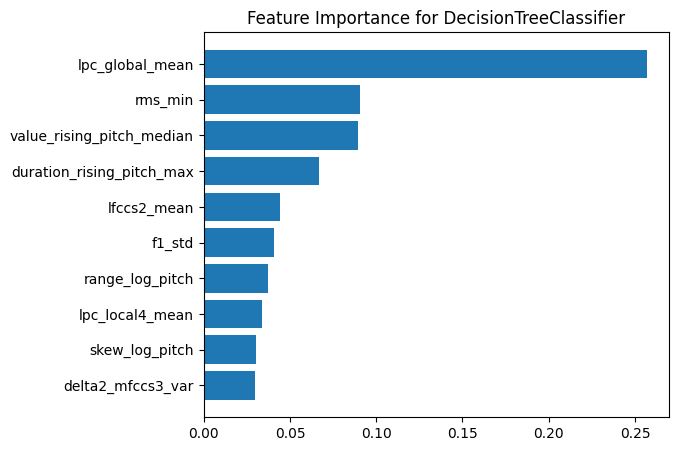

In [102]:
dtc_best_model = load_model('DecisionTreeClassifier', 'f1_macro') # load model
feature_imp_dtc = feature_importance(dtc_best_model, X_test, y_test, top=10)

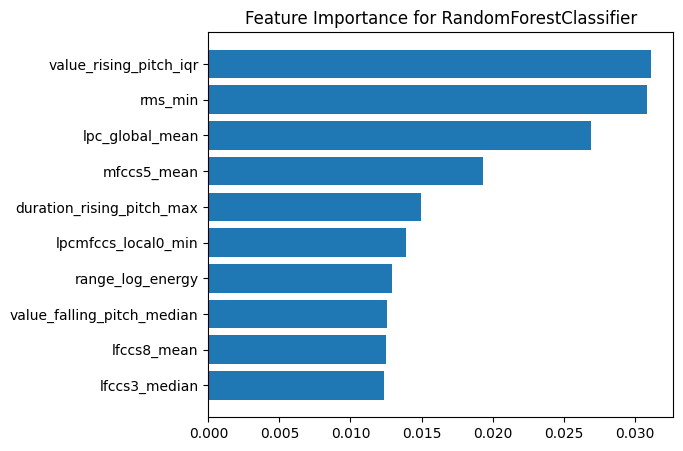

In [103]:
rfc_best_model = load_model('RandomForestClassifier', 'f1_macro') # load model
feature_imp_rfc = feature_importance(rfc_best_model, X_test, y_test, top=10)

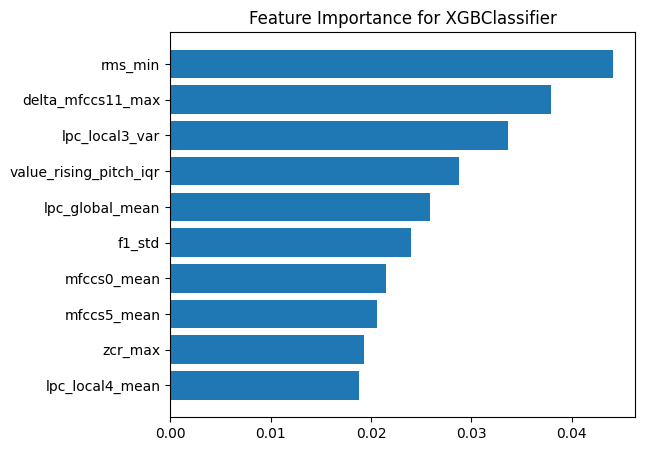

In [104]:
xgb_best_model = load_model('XGBClassifier', 'f1_macro') # load model
feature_imp_xgb = feature_importance(xgb_best_model, X_test, y_test, top=10)

In [105]:
# load the data with all numerical features for best XGB model
df_all_stats = pd.read_pickle('../results/df_prep_numerical_only_all_stats.pkl')

# load train/test data
X_train, X_test, y_train, y_test = load_train_test_data(df_all_stats, verbose=False, test_size=0.3)

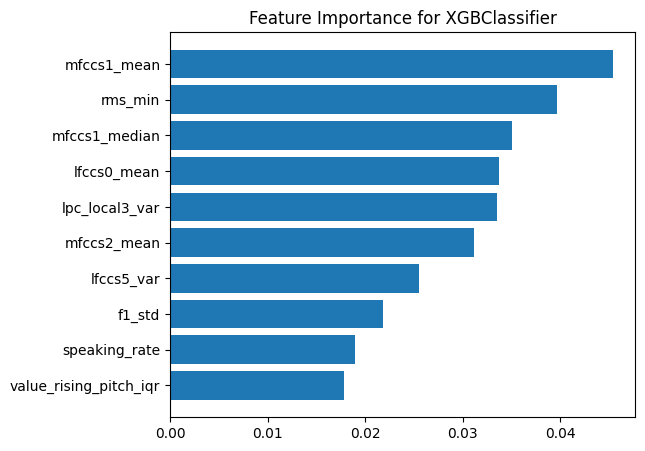

In [106]:
xgb_best_model_all_stats = load_model('XGBClassifier', 'f1_macro', name_spec='with_all_stats')
feature_imp_xgb_all_stats = feature_importance(xgb_best_model_all_stats, X_test, y_test, top=10)